In [1]:
!nvidia-smi

Tue Feb 18 16:21:03 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.29.06              Driver Version: 545.29.06    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3090        Off | 00000000:19:00.0 Off |                  N/A |
|  0%   24C    P8              23W / 350W |   5025MiB / 24576MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import numpy as np
import math
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch.optim as optim
from torch.nn.parameter import Parameter
from torch import Tensor
from pyDOE import lhs
from function_facc3 import *

import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

device = torch.device('cuda:0' if torch.cuda.is_available() else ' cpu')
print(device)

cuda:0


In [3]:
rho = 1 # density
mu = 0.01 # viscosity
k_fluid = 0.1 # thermal conductivity
inlet = 1
temp = 10
k_solid = 10 
cp = 50 # specific heat capacity
thermal_diffusivity = k_fluid / (rho * cp)
k_mu = mu / rho # kinematic viscosity

density_surface = 20000 # 단위 면적당 개수
density_line =  1000


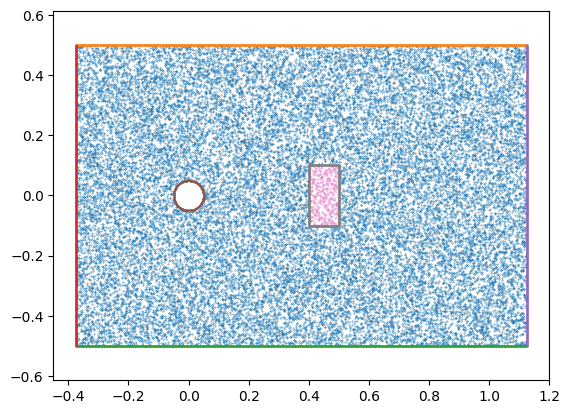

(35786, 3)


In [4]:
collocation_points = COLLOCATION_POINTS(density_surface, density_line)
print(collocation_points.shape)

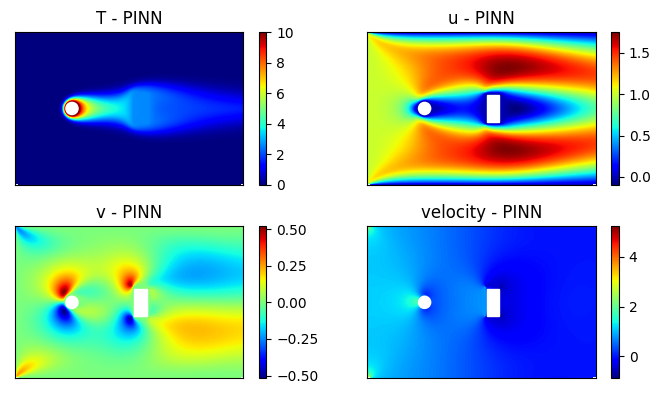

In [5]:
import scipy.interpolate
import matplotlib.patches as patches

cor_fluid = np.loadtxt("./CFD/mu_01_50/xy_cor_fluid.txt")
cor_saga = np.loadtxt("./CFD/mu_01_50/xy_cor_saga.txt")
# cor[:, 0] = cor[:, 0] - 0.5
# cor[:, 1] = cor[:, 1] - 0.5

u_fluid = np.loadtxt("./CFD/mu_01_50/u_fluid.txt")
v_fluid = np.loadtxt("./CFD/mu_01_50/v_fluid.txt")
p_fluid = np.loadtxt("./CFD/mu_01_50/p_fluid.txt")
T_fluid = np.loadtxt("./CFD/mu_01_50/T_fluid.txt") - 273.15
T_saga = np.loadtxt("./CFD/mu_01_50/T_saga.txt") - 273.15

u_fluid_max, u_fluid_min = np.max(u_fluid), np.min(u_fluid)
v_fluid_max, v_fluid_min = np.max(v_fluid), np.min(v_fluid)
p_fluid_max, p_fluid_min = np.max(p_fluid), np.min(p_fluid)
T_fluid_max, T_fluid_min = np.max(T_fluid), np.min(T_fluid)
T_saga_max, T_saga_min = np.max(T_saga), np.min(T_saga)

vel_CFD = np.sqrt(u_fluid**2 + v_fluid**2)
vel_CFD_max = np.max(vel_CFD)
vel_CFD_min = np.min(vel_CFD)

CFD_results_fluid = np.vstack([u_fluid, v_fluid, p_fluid, T_fluid]).T
CFD_results_saga = T_saga.reshape(-1 ,1)

def interpolate_output(x, y, us, extent):
    "Interpolates irregular points onto a mesh"

    # define mesh to interpolate onto
    xyi = np.meshgrid(
        np.linspace(extent[0], extent[1], 500),
        np.linspace(extent[2], extent[3], 500),
        indexing="ij",
    )

    # linearly interpolate points onto mesh
    us = [scipy.interpolate.griddata(
        (x, y), u, tuple(xyi)
        )
        for u in us]

    return us

def plot(cor_fluid, cor_saga):
    x, y = cor_fluid[:, 0], cor_fluid[:, 1]

    T_inter, u_inter, v_inter, p_inter = interpolate_output(x, y,
                                                           [T_fluid.reshape(-1, 1), u_fluid.reshape(-1, 1), v_fluid.reshape(-1, 1), p_fluid.reshape(-1, 1)],
                                                           [-0.375, 1.125, -0.5, 0.5],
    )

    T_inter = T_inter.squeeze(axis=2)
    u_inter = u_inter.squeeze(axis=2)
    v_inter = v_inter.squeeze(axis=2)
    p_inter = p_inter.squeeze(axis=2)
    
    plt.figure(figsize=(7, 4))
    plt.subplot(2, 2, 1)
    plt.title('T - PINN')
    plt.imshow(T_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)

    plt.subplot(2, 2, 2)
    plt.title('u - PINN')
    plt.imshow(u_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=u_fluid_min, vmax=u_fluid_max, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)

    plt.subplot(2, 2, 3)
    plt.title('v - PINN')
    plt.imshow(v_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=v_fluid_min, vmax=v_fluid_max, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)

    plt.subplot(2, 2, 4)
    plt.title('velocity - PINN')
    plt.imshow(p_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=p_fluid_min, vmax=p_fluid_max, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)
    plt.tight_layout()
    # plt.savefig('./image/facc_pinn_v4_01_50/facc_pinn_v4.png'.format(epoch),format='png', dpi=100, bbox_inches='tight', pad_inches=0)
    plt.show()

plot(cor_fluid, cor_saga)

In [6]:
def PDE_F1(model1, collocation_points):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    
    idx_domain_fluid = np.where(X[:, 0] == 0)
    colp_domain_fluid = X[idx_domain_fluid][:, 1:].to(device)
    Domain_fluid = model1(colp_domain_fluid)
    
    u = Domain_fluid[:, 0]
    v = Domain_fluid[:, 1]
    p = Domain_fluid[:, 2]

    u_x_y = autograd.grad(u, colp_domain_fluid, torch.ones(u.shape).to(device), retain_graph = True, create_graph = True)[0]
    du_x = u_x_y[:, 0:1]
    du_y = u_x_y[:, 1:2]
    
    u_xx_xy = autograd.grad(du_x, colp_domain_fluid, torch.ones(du_x.shape).to(device), retain_graph = True, create_graph = True)[0]
    u_yx_yy = autograd.grad(du_y, colp_domain_fluid, torch.ones(du_y.shape).to(device), retain_graph = True, create_graph = True)[0]
    
    v_x_y = autograd.grad(v, colp_domain_fluid, torch.ones(v.shape).to(device), retain_graph = True, create_graph = True)[0]
    dv_x = v_x_y[:, [0]]
    dv_y = v_x_y[:, [1]]
    
    v_xx_xy = autograd.grad(dv_x, colp_domain_fluid, torch.ones(dv_x.shape).to(device), create_graph = True)[0]
    v_yx_yy = autograd.grad(dv_y, colp_domain_fluid, torch.ones(dv_y.shape).to(device), create_graph = True)[0]
    
    p_x_y = autograd.grad(p, colp_domain_fluid, torch.ones(p.shape).to(device), create_graph = True)[0]
    
    du_xx = u_xx_xy[:, [0]]
    du_yy = u_yx_yy[:, [1]]
    
    dv_xx = v_xx_xy[:, [0]]
    dv_yy = v_yx_yy[:, [1]]
    
    dp_x = p_x_y[:, [0]]
    dp_y = p_x_y[:, [1]]
    
    u = u.reshape(-1, 1)
    v = v.reshape(-1, 1)

    pde_u = rho * (u * du_x + v * du_y) + dp_x - mu * (du_xx + du_yy)
    pde_v = rho * (u * dv_x + v * dv_y) + dp_y - mu * (dv_xx + dv_yy)
    pde_cont = du_x + dv_y
    
    return [pde_u.float(), pde_v.float(),  pde_cont.float()]

def PDE_F2(model1, model2, collocation_points):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    
    idx_domain_fluid = np.where(X[:, 0] == 0)
    colp_domain_fluid = X[idx_domain_fluid][:, 1:].to(device)
    
#     with torch.no_grad():
#         model1.eval()
    Domain_fluid1 = model1(colp_domain_fluid)
    
    Domain_fluid2 = model2(colp_domain_fluid)
    
    u = Domain_fluid1[:, 0:1]
    v = Domain_fluid1[:, 1:2]
    T = Domain_fluid2[:, 0:1]
    
    u_x_y = autograd.grad(u, colp_domain_fluid, torch.ones(u.shape).to(device), retain_graph = True, create_graph = True)[0]
    du_x = u_x_y[:, 0:1]
    du_y = u_x_y[:, 1:2]
    
    T_x_y = autograd.grad(T, colp_domain_fluid, torch.ones(T.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_x = T_x_y[:, 0:1]
    dT_y = T_x_y[:, 1:2]
    
    T_xx_xy = autograd.grad(dT_x, colp_domain_fluid, torch.ones(dT_x.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_xx = T_xx_xy[:, 0:1]
    
    T_yx_yy = autograd.grad(dT_y, colp_domain_fluid, torch.ones(dT_y.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_yy = T_yx_yy[:, 1:2]
    
    pde_t = (u * dT_x + v * dT_y) - thermal_diffusivity * (dT_xx + dT_yy) #- (k_mu/cp) * du_y**2
    
    return [pde_t.float()]

def PDE_S(model2, collocation_points):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    
    idx_domain_solid = np.where(X[:, 0] == 6)[0]
    
    colp_domain_solid = X[idx_domain_solid][:, 1:].to(device)
    
    Domain_solid = model2(colp_domain_solid)
    
    T = Domain_solid[:, 0:1]
                    
    T_x_y = torch.autograd.grad(T, colp_domain_solid, torch.ones(T.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_x = T_x_y[:, 0:1]
    dT_y = T_x_y[:, 1:2]
    
    T_xx_yx = torch.autograd.grad(dT_x, colp_domain_solid, torch.ones(dT_x.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_xx = T_xx_yx[:, 0:1]
    
    T_xy_yy = torch.autograd.grad(dT_y, colp_domain_solid, torch.ones(dT_y.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_yy = T_xy_yy[:, 1:2]
                    
    pde_t = k_solid * (dT_xx + dT_yy)
                    
    return [pde_t.float()]

def BC_F(model1, collocation_points, inlet):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    idx_bc_top = np.where(X[:, 0] == 1)[0]
    idx_bc_bottom = np.where(X[:, 0] == 2)[0]
    idx_bc_left = np.where(X[:, 0] == 3)[0]
    idx_bc_right = np.where(X[:, 0] == 4)[0]
    idx_bc_cylinder = np.where(X[:, 0] == 5)[0]
    idx_bc_saga = np.where(X[:, 0] == 7)[0]
    colp_bc = X[:, 1:].to(device)
    colp_bc_right = X[idx_bc_right][:, 1:].to(device)
    
    BC_top = model1(colp_bc[idx_bc_top])[:, 0:2]
    BC_bottom = model1(colp_bc[idx_bc_bottom])[:, 0:2]
    BC_left_u = model1(colp_bc[idx_bc_left])[:, 0] - torch.ones_like(model1(colp_bc[idx_bc_left])[:, 0]) * inlet
    BC_left_v = model1(colp_bc[idx_bc_left])[:, 1]
    BC_right = model1(colp_bc[idx_bc_right])[:, 2] 
    BC_cylinder = model1(colp_bc[idx_bc_cylinder])[:, 0:2]
    BC_saga = model1(colp_bc[idx_bc_saga])[:, 0:2]
    
    return [BC_top.float(), BC_bottom.float(), BC_left_u.float(), BC_left_v.float(), 
            BC_right.float(), BC_cylinder.float(), BC_saga.float()]

def BC_T(model2, collocation_points):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    idx_bc_top = np.where(X[:, 0] == 1)[0]
    idx_bc_bottom = np.where(X[:, 0] == 2)[0]
    idx_bc_left = np.where(X[:, 0] == 3)[0]
    idx_bc_right = np.where(X[:, 0] == 4)[0]
    idx_bc_cylinder = np.where(X[:, 0] == 5)[0]
    idx_bc_saga = np.where(X[:, 0] == 7)[0]
    colp_bc = X[:, 1:].to(device)
    colp_bc_right = X[idx_bc_right][:, 1:].to(device)
    
    T_top = model2(colp_bc[idx_bc_top])[:, 0]
    T_bottom = model2(colp_bc[idx_bc_bottom])[:, 0]
    T_left = model2(colp_bc[idx_bc_left])[:, 0]
    T_right = model2(colp_bc_right)[:, 0]
    T_right_x_y = autograd.grad(T_right, colp_bc_right, torch.ones(T_right.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_right_x = T_right_x_y[:, 0:1]
    
    T_cylinder = model2(colp_bc[idx_bc_cylinder])[:, 0] - torch.ones_like(model2(colp_bc[idx_bc_cylinder])[:, 0]) * temp
    
    return [T_top.float(), T_bottom.float(), T_left.float(), dT_right_x.float(), T_cylinder.float()]

In [7]:
def PLOT(model1, model2, col_fluid, col_saga, CFD_fluid, CFD_saga, epoch, history=False):
    X1 = col_fluid.copy()
    X2 = col_saga.copy()
    X1 = torch.tensor(X1, requires_grad=False)
    X2 = torch.tensor(X2, requires_grad=False)
    
    with torch.no_grad():
        model1.eval()
        model2.eval()
        
        plt.figure(figsize=(7, 4))
        test_result1 = model1(X1.to(device))
        test_result2 = model2(X1.to(device))
        test_result3 = model2(X2.to(device))

        u_test = test_result1[:, 0].detach().cpu().numpy().reshape(-1, 1)
        v_test = test_result1[:, 1].detach().cpu().numpy().reshape(-1, 1)
        p_test = test_result1[:, 2].detach().cpu().numpy().reshape(-1, 1)
        T1_test = (test_result2[:, 0].detach().cpu().numpy()).reshape(-1, 1)
        T2_test = (test_result3[:, 0].detach().cpu().numpy()).reshape(-1, 1)
        
        x1, y1 = X1[:, 0], X1[:, 1]
        x2, y2 = X2[:, 0], X2[:, 1]
#         x, y = torch.concat([x1, x2]), torch.concat([y1, y2])
        T1_pred, u_pred, v_pred, p_pred = interpolate_output(x1, y1,
                                                            [T1_test, u_test, v_test, p_test],
                                                            [-0.375, 1.125, -0.5, 0.5],
        )
        T2_pred = interpolate_output(x2, y2,
                                     [T2_test],
                                     [-0.375, 1.125, -0.5, 0.5])
        
        T1_pred = T1_pred.squeeze(axis=2)
        u_pred = u_pred.squeeze(axis=2)
        v_pred = v_pred.squeeze(axis=2)
        p_pred = p_pred.squeeze(axis=2)
        T2_pred = T2_pred[0].squeeze(axis=2)
        
#         T1_pred_history.append(T1_pred)
#         T2_pred_history.append(T2_pred)
#         u_pred_history.append(u_pred)
#         v_pred_history.append(v_pred)
#         p_pred_history.append(p_pred)
        
        plt.subplot(2, 2, 1)
        plt.title('T - PINN')
        plt.imshow(T1_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
        plt.imshow(T2_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(2, 2, 2)
        plt.title('u - PINN')
        plt.imshow(u_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=u_fluid_min, vmax=u_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(2, 2, 3)
        plt.title('v - PINN')
        plt.imshow(v_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=v_fluid_min, vmax=v_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(2, 2, 4)
        plt.title('p - PINN')
        plt.imshow(p_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=p_fluid_min, vmax=p_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        plt.tight_layout()
        plt.savefig('./image/facc_pinn_v10/facc_pinn_v10_{0:06d}.png'.format(epoch),format='png', dpi=100, bbox_inches='tight', pad_inches=0)
        plt.show()
        
        plt.close()

    if history==True:
        plt.plot(loss_record, label='total')
        plt.yscale("log")
        plt.legend()
        plt.show()
    model1.train()
    model2.train()

In [8]:
class MODEL(nn.Module):
    def __init__(self, layers, mapping_size, scale, FF = False):
        super().__init__()
        
        self.FF = FF
        self.FourierFeature = GauossianFourierFeatureTransform_1D(2, mapping_size, scale)
        
        'activation function'
        self.activation = nn.Tanh()
        
        self.layers = layers
        'initialize neural network as a list using nn.Modulelist'
        self.linears = nn.ModuleList([nn.Linear(layers[i], layers[i + 1]) for i in range(len(layers) - 1)])
        
        self.iter = 0
        
        'Xavier Normal initialization'
        for i in range(len(layers) - 1):
            nn.init.xavier_normal_(self.linears[i].weight.data, gain = 1.0) # weight from a normal distribution with recommanded gain value
            nn.init.zeros_(self.linears[i].bias.data) # set biases to zero
            
    def forward(self, x):
        if torch.is_tensor(x) != True:
            print('Input is not tensor')
        
        a = x.float()
        
        if self.FF == True:
            
            a = self.FourierFeature(a)
        
        for i in range(len(self.layers) - 2):
            z = self.linears[i](a)
            a = self.activation(z)
        
        a = self.linears[-1](a)
        
        return a

In [22]:
'Fourier Feature'
scale = np.linspace(3, 3, 1)
mapping_size = 128
FF = True

'''
'domain_fluid': 0, 'bc_fluid_top': 1, 'bc_fluid_bottom': 2, 'bc_fluid_left': 3, 'bc_fluid_right': 4
'''
#mapping_size * len(scale) * 2
m_layers1 = [mapping_size * len(scale) * 2, 650, 650, 650, 650, 650, 3]
m_layers2 = [mapping_size * len(scale) * 2, 650, 650, 650, 650, 650, 1]

model1 = MODEL(m_layers1, mapping_size, scale, FF).to(device)
model2 = MODEL(m_layers2, mapping_size, scale, FF).to(device)

optimizer1 = torch.optim.Adam(model1.parameters(), lr=5e-5)
optimizer2 = torch.optim.Adam(model2.parameters(), lr=5e-5)

Loss_func = nn.MSELoss(reduction='mean')
max_loss = np.inf

In [23]:
total_params = 0

model_list = [model1, model2]

for model in model_list:
    for name, param in model.named_parameters():
        if param.requires_grad:
            param_count = param.numel()
            total_params += param_count

# 총 파라미터 수 추가
print("Model Parameter Count {}".format(total_params))

Model Parameter Count 3721904


In [10]:
epoch = 0
Loss_pde_for = 0
Loss_bc_for = 0
cor = collocation_points[:, 1:]

loss_history = []
loss_history_pde = []
loss_history_bc = []
loss_history_sb = []

Epoch: 0 Loss: 15484952.00000000 Loss1: 370.16149902 Loss2: 15484582.00000000


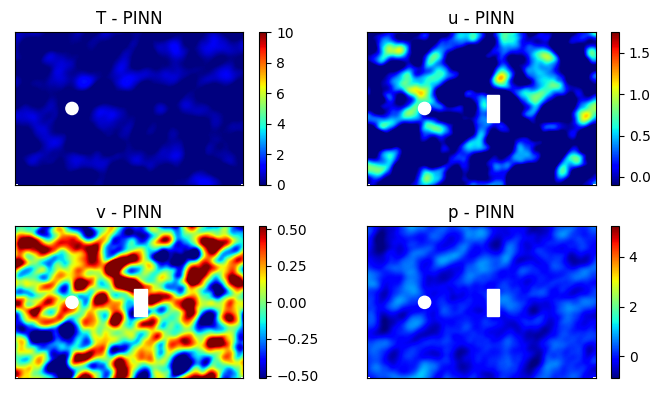

Epoch: 500 Loss: 744.13659668 Loss1: 0.61551321 Loss2: 743.52105713


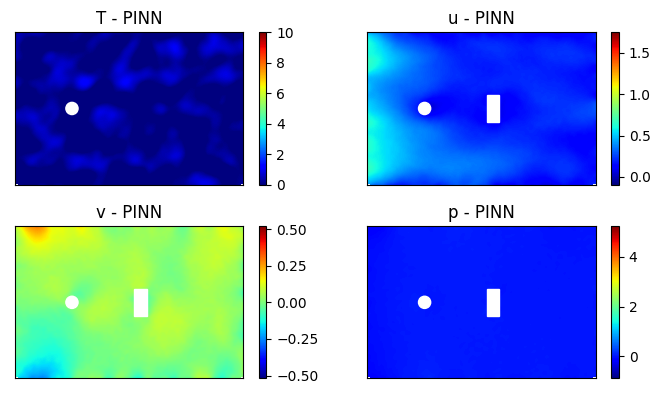

Epoch: 1000 Loss: 372.87820435 Loss1: 0.31203163 Loss2: 372.56616211


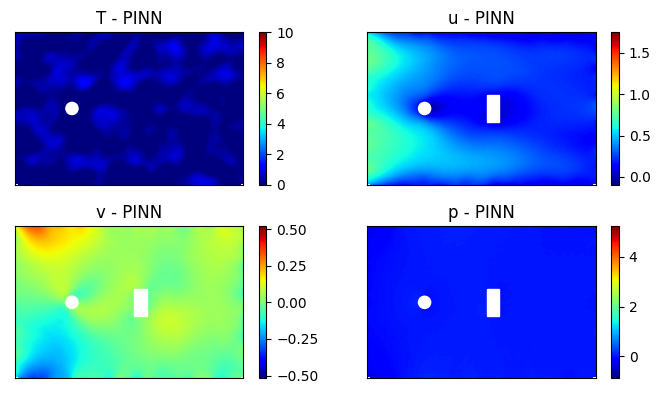

Epoch: 1500 Loss: 753.25933838 Loss1: 0.20959762 Loss2: 753.04974365


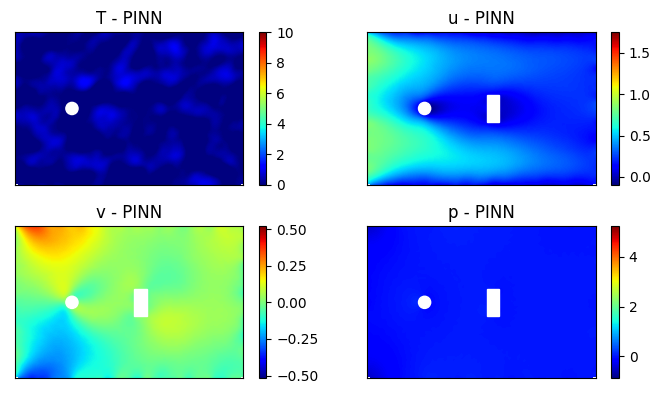

Epoch: 2000 Loss: 1541.99731445 Loss1: 0.15571596 Loss2: 1541.84155273


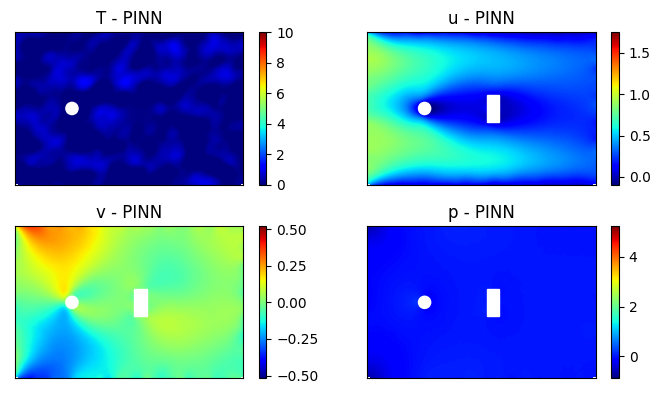

Epoch: 2500 Loss: 16247.68261719 Loss1: 0.12308062 Loss2: 16247.55957031


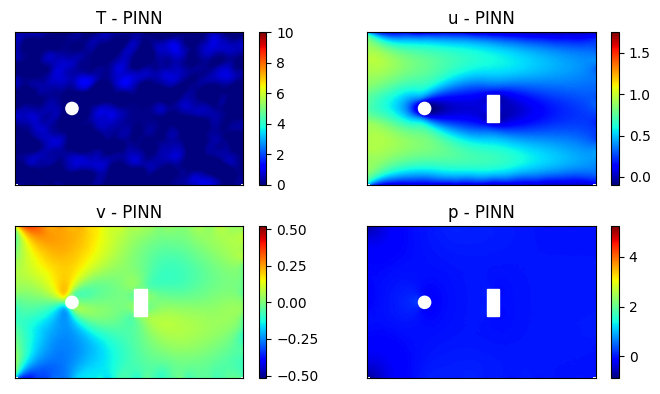

Epoch: 3000 Loss: 1066.09912109 Loss1: 0.10118636 Loss2: 1065.99792480


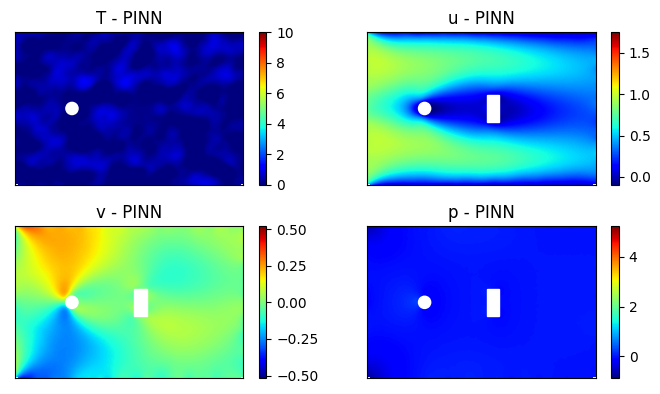

Epoch: 3500 Loss: 1100.38024902 Loss1: 0.08516286 Loss2: 1100.29504395


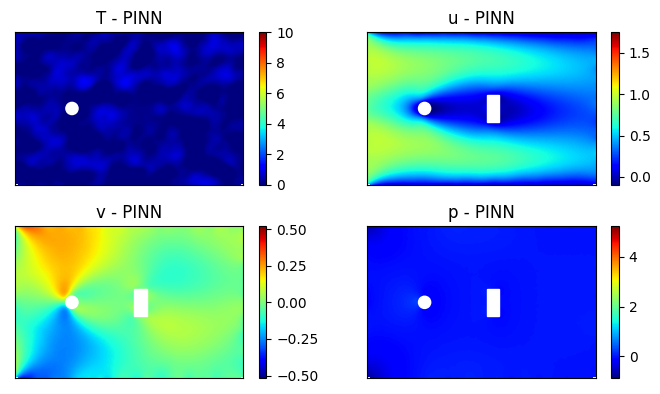

Epoch: 4000 Loss: 2217.76220703 Loss1: 0.07486372 Loss2: 2217.68725586


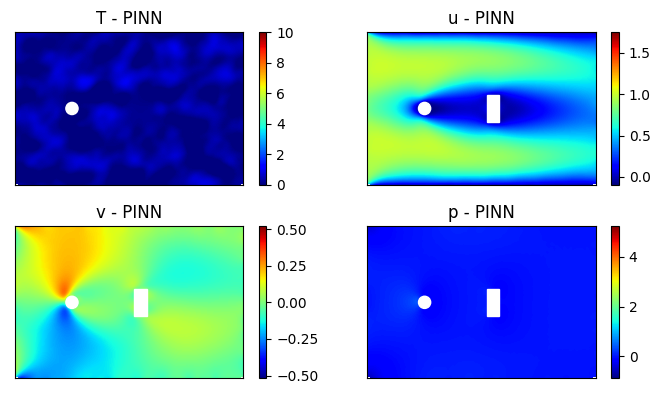

Epoch: 4500 Loss: 934.39416504 Loss1: 0.07180040 Loss2: 934.32238770


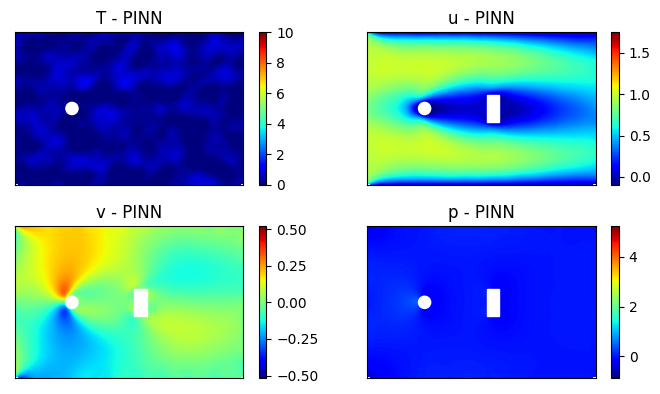

Epoch: 5000 Loss: 5372.40234375 Loss1: 0.05767432 Loss2: 5372.34472656


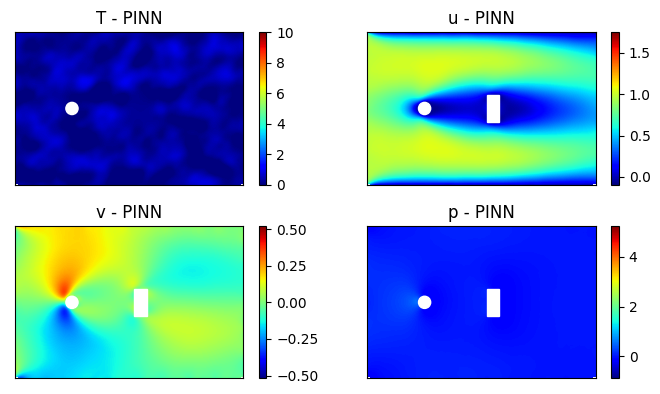

Epoch: 5500 Loss: 2816.71118164 Loss1: 0.05203096 Loss2: 2816.65917969


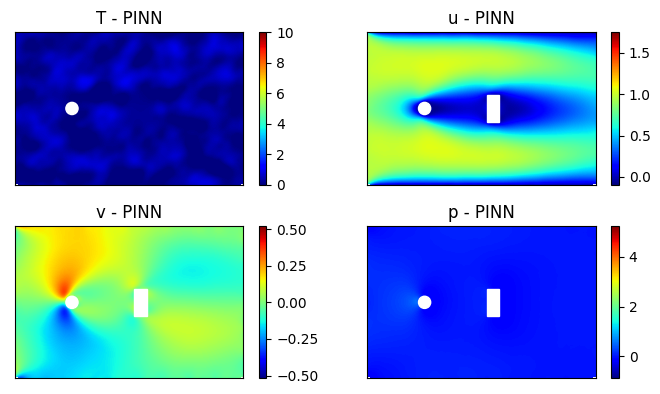

Epoch: 6000 Loss: 10187.85156250 Loss1: 0.04561432 Loss2: 10187.80566406


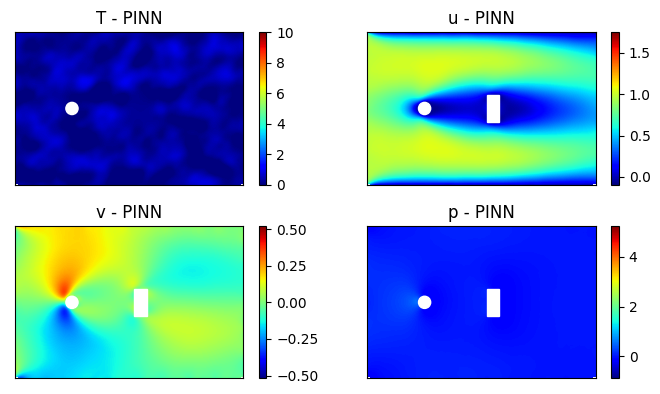

Epoch: 6500 Loss: 657.11499023 Loss1: 0.04360658 Loss2: 657.07141113


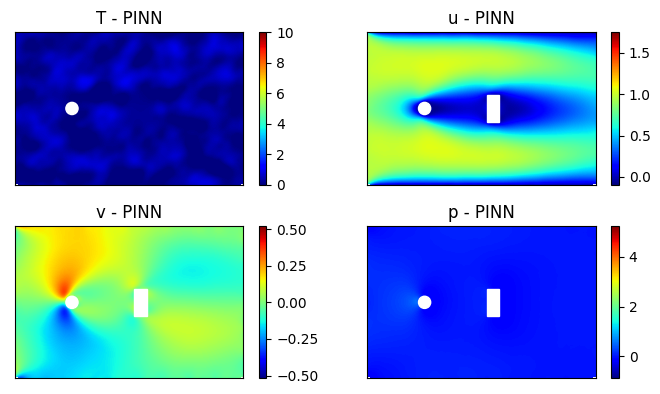

Epoch: 7000 Loss: 1722.74035645 Loss1: 0.04279532 Loss2: 1722.69750977


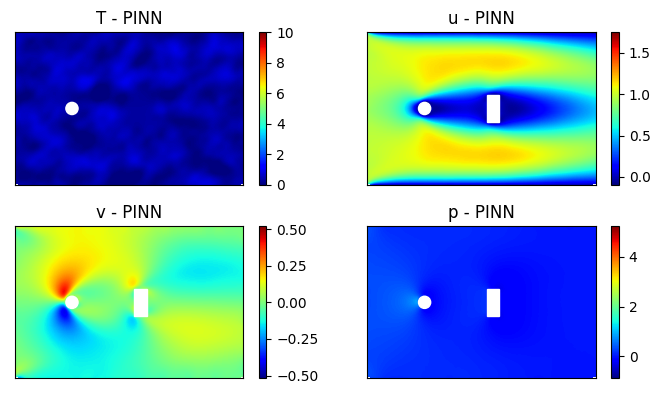

Epoch: 7500 Loss: 481.15496826 Loss1: 0.03867585 Loss2: 481.11630249


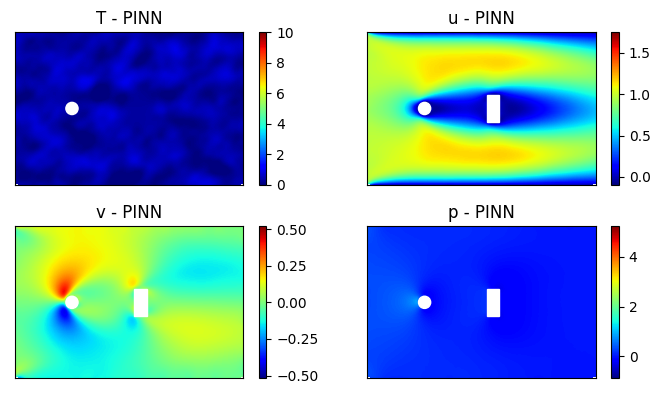

Epoch: 8000 Loss: 390.36532593 Loss1: 0.03613063 Loss2: 390.32919312


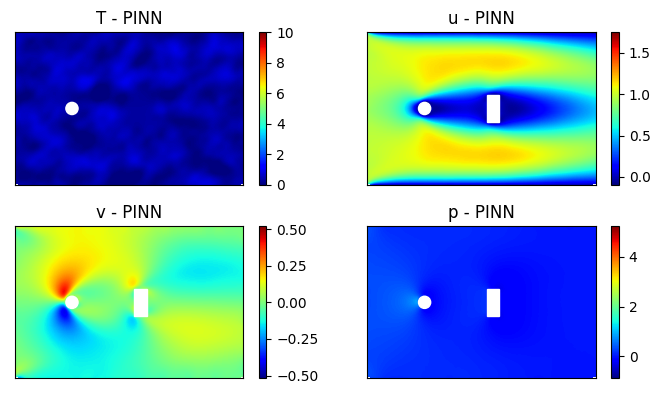

Epoch: 8500 Loss: 352.45632935 Loss1: 0.03171379 Loss2: 352.42462158


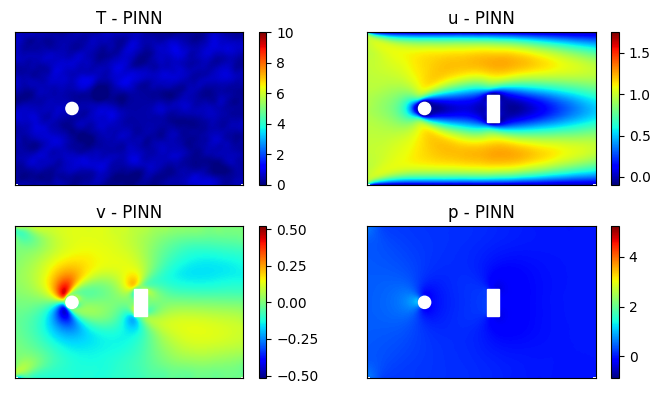

Epoch: 9000 Loss: 290.96398926 Loss1: 0.04109497 Loss2: 290.92288208


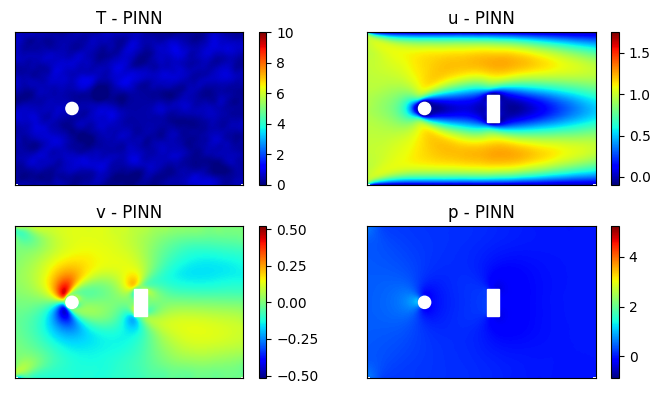

Epoch: 9500 Loss: 538.19000244 Loss1: 0.05065574 Loss2: 538.13934326


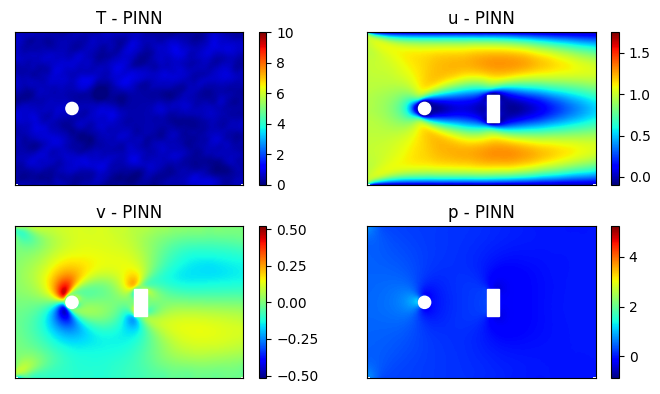

Epoch: 10000 Loss: 1144.92065430 Loss1: 0.02848802 Loss2: 1144.89221191


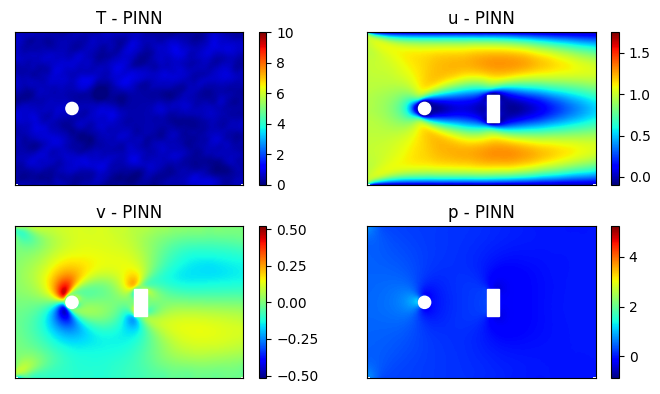

Epoch: 10500 Loss: 362.41299438 Loss1: 0.02608900 Loss2: 362.38690186


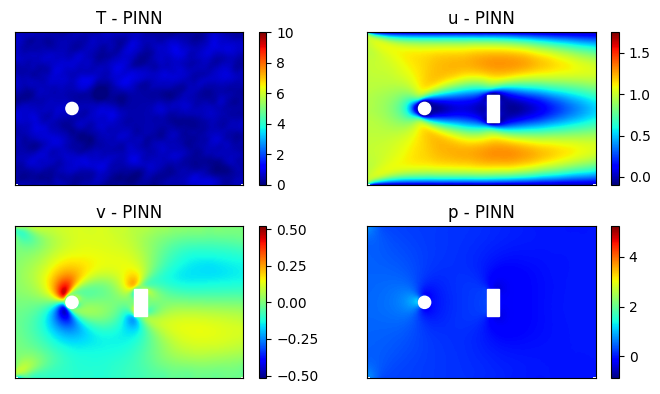

Epoch: 11000 Loss: 307.51315308 Loss1: 0.03066674 Loss2: 307.48248291


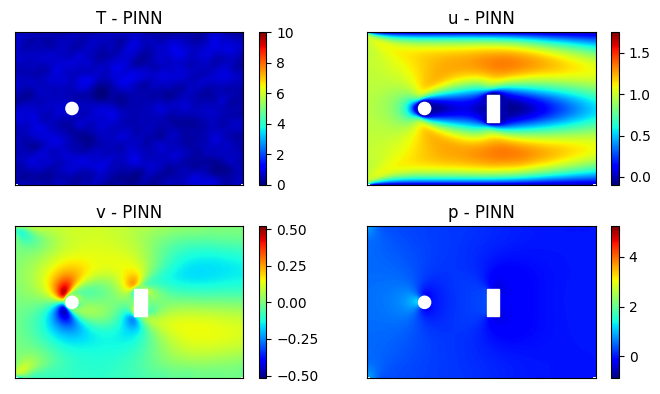

Epoch: 11500 Loss: 209.10140991 Loss1: 0.02582001 Loss2: 209.07559204


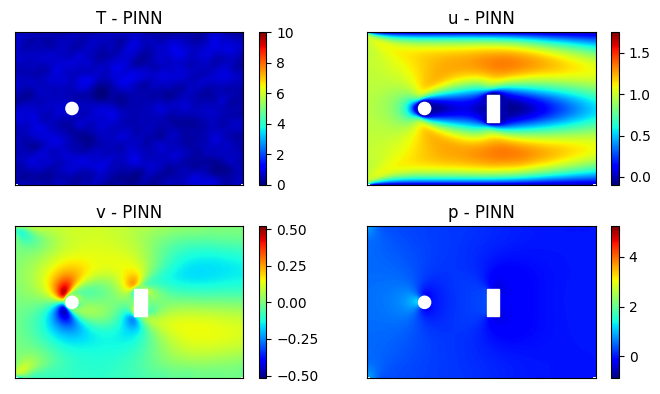

Epoch: 12000 Loss: 252.20196533 Loss1: 0.02529714 Loss2: 252.17666626


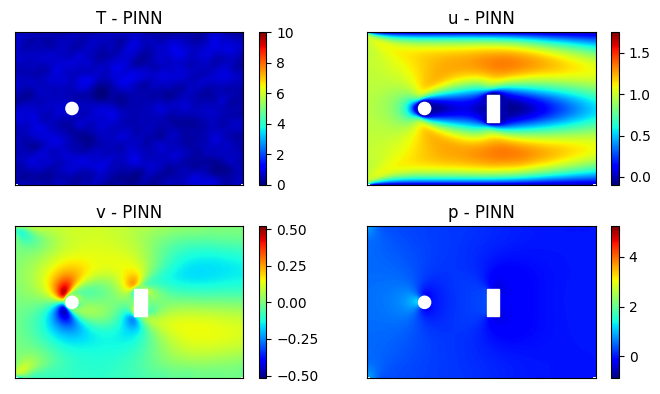

Epoch: 12500 Loss: 123.26575470 Loss1: 0.02798178 Loss2: 123.23777008


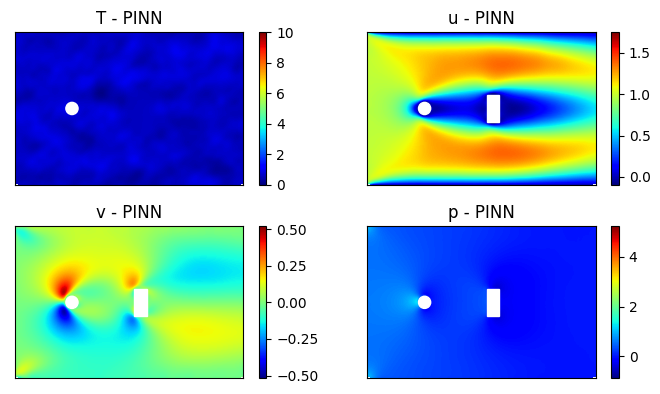

Epoch: 13000 Loss: 2004.44152832 Loss1: 0.02661755 Loss2: 2004.41491699


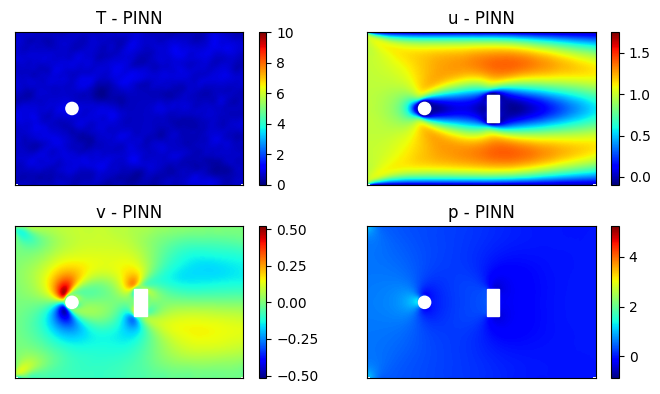

Epoch: 13500 Loss: 281.64938354 Loss1: 0.02377419 Loss2: 281.62561035


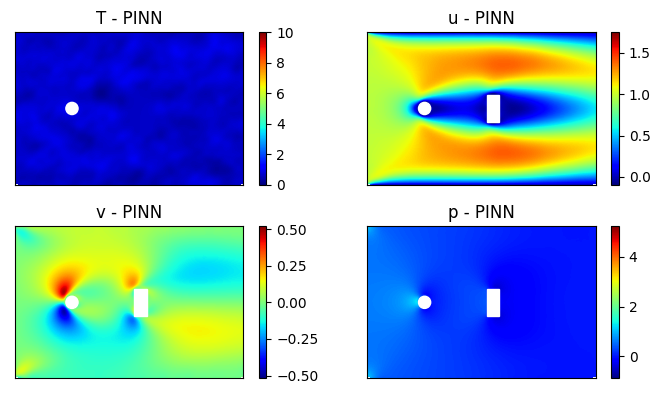

Epoch: 14000 Loss: 117.21228027 Loss1: 0.02227855 Loss2: 117.19000244


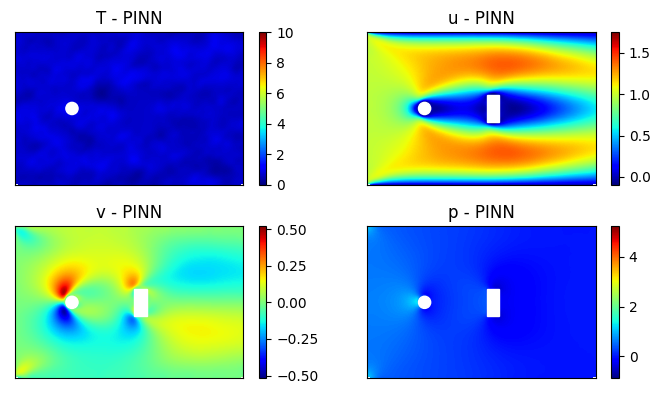

Epoch: 14500 Loss: 429.00634766 Loss1: 0.02215259 Loss2: 428.98419189


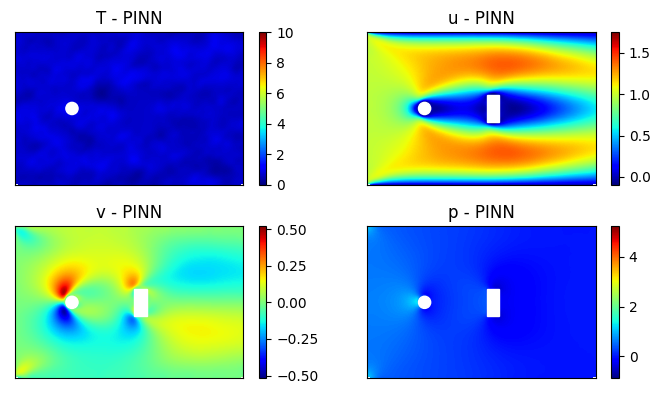

Epoch: 15000 Loss: 144.72917175 Loss1: 0.02348704 Loss2: 144.70568848


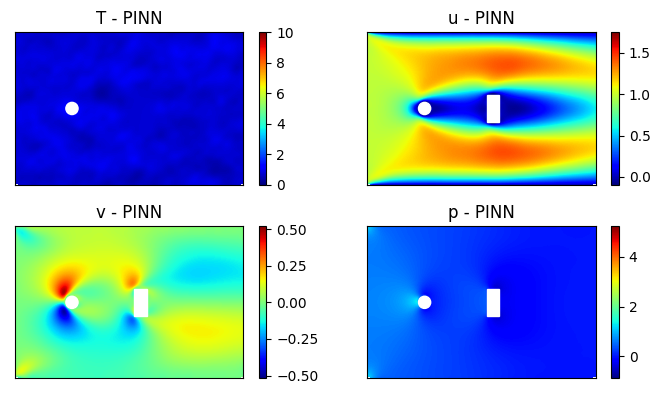

Epoch: 15500 Loss: 209.60835266 Loss1: 0.02198566 Loss2: 209.58636475


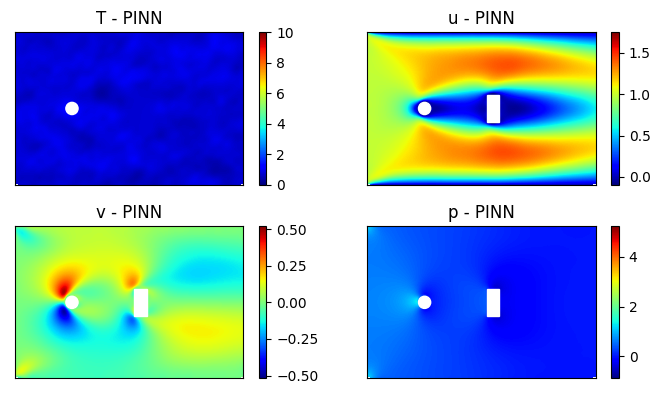

Epoch: 16000 Loss: 103.97124481 Loss1: 0.02523652 Loss2: 103.94600677


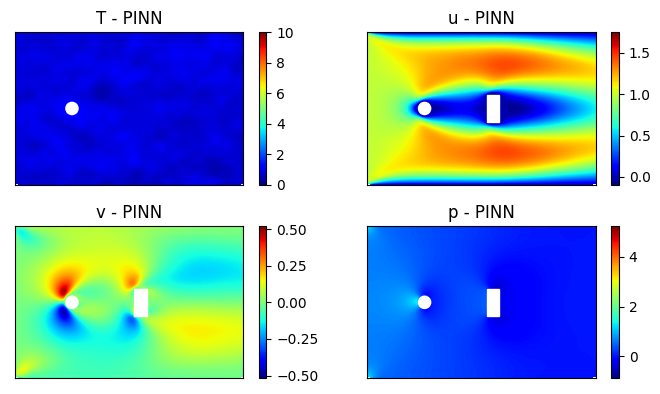

Epoch: 16500 Loss: 400.37298584 Loss1: 0.02282098 Loss2: 400.35015869


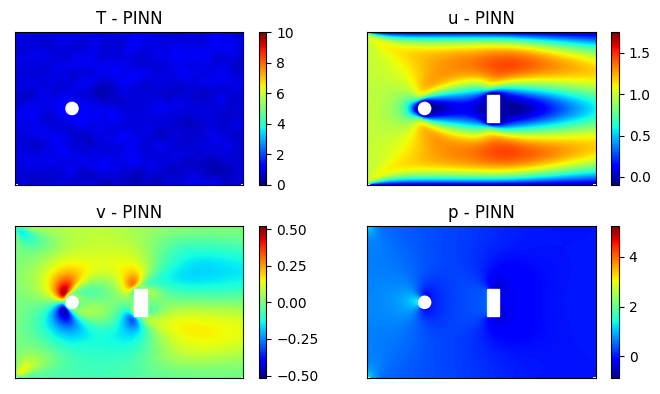

Epoch: 17000 Loss: 142.92857361 Loss1: 0.02431450 Loss2: 142.90426636


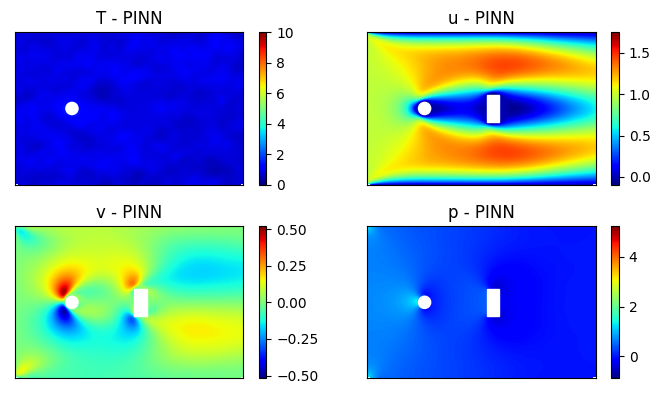

Epoch: 17500 Loss: 157.62867737 Loss1: 0.02115658 Loss2: 157.60751343


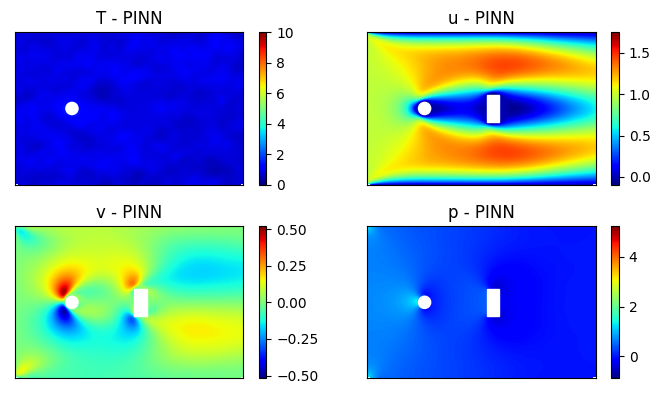

Epoch: 18000 Loss: 156.39663696 Loss1: 0.01876592 Loss2: 156.37786865


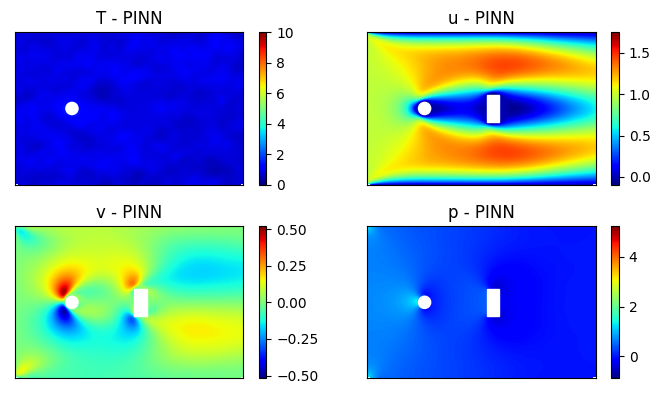

Epoch: 18500 Loss: 93.43631744 Loss1: 0.02019929 Loss2: 93.41611481


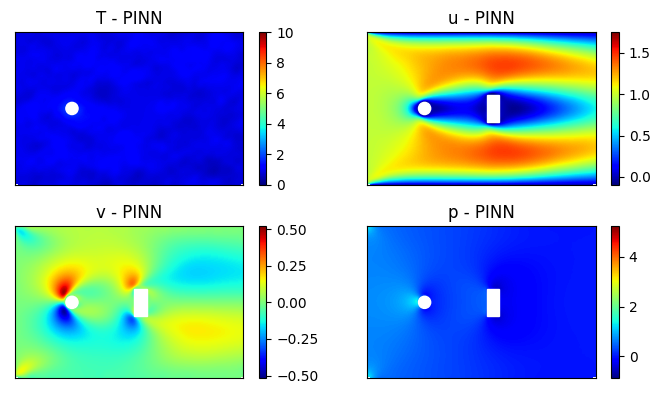

Epoch: 19000 Loss: 192.78205872 Loss1: 0.01905174 Loss2: 192.76300049


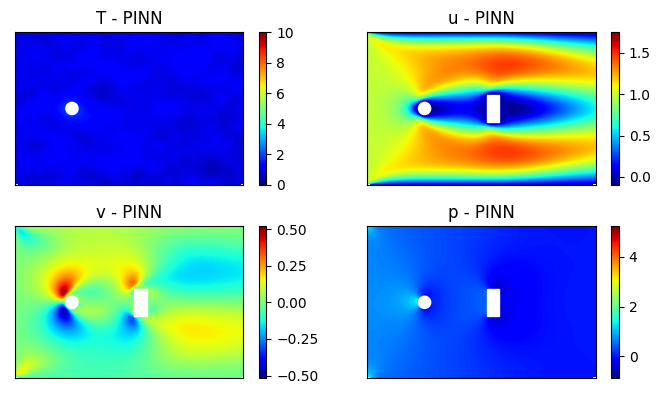

Epoch: 19500 Loss: 77.74146271 Loss1: 0.01819639 Loss2: 77.72326660


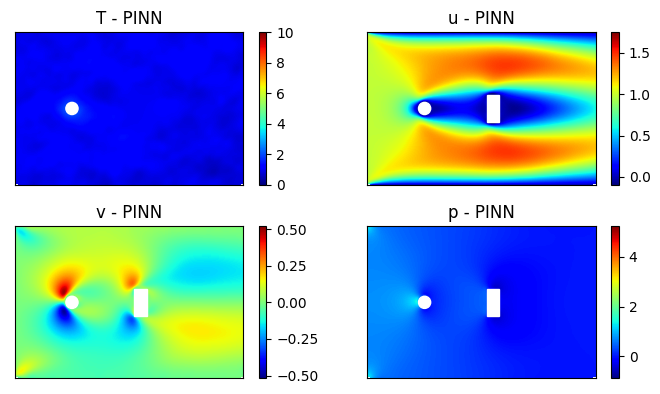

Epoch: 20000 Loss: 82.84710693 Loss1: 0.01768485 Loss2: 82.82942200


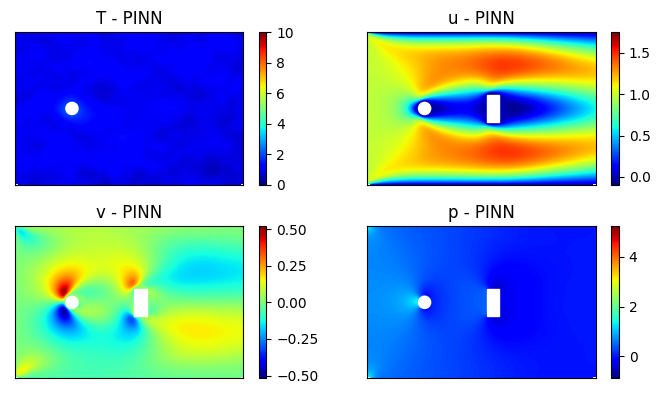

Epoch: 20500 Loss: 83.28847504 Loss1: 0.01657346 Loss2: 83.27190399


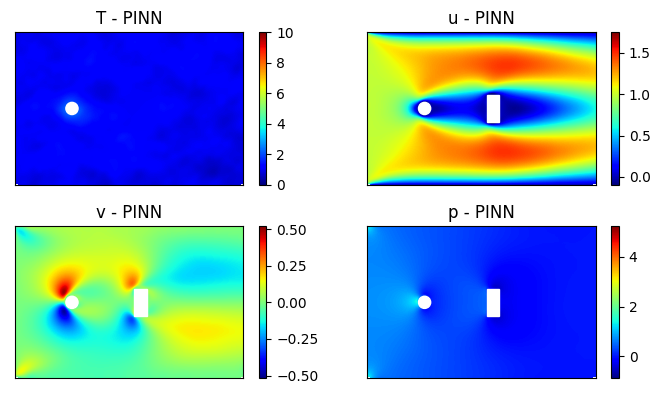

Epoch: 21000 Loss: 75.13065338 Loss1: 0.02041081 Loss2: 75.11024475


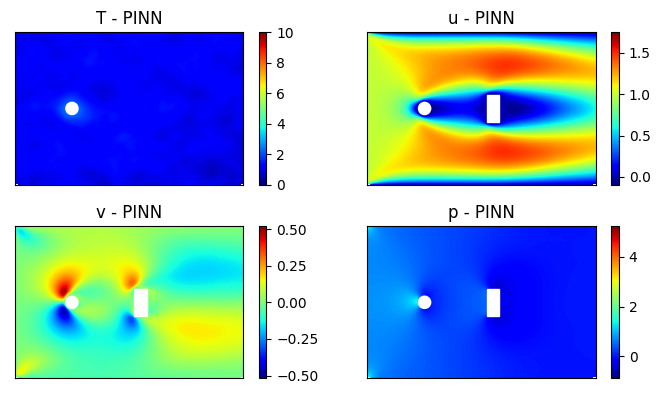

Epoch: 21500 Loss: 410.03656006 Loss1: 0.02014173 Loss2: 410.01641846


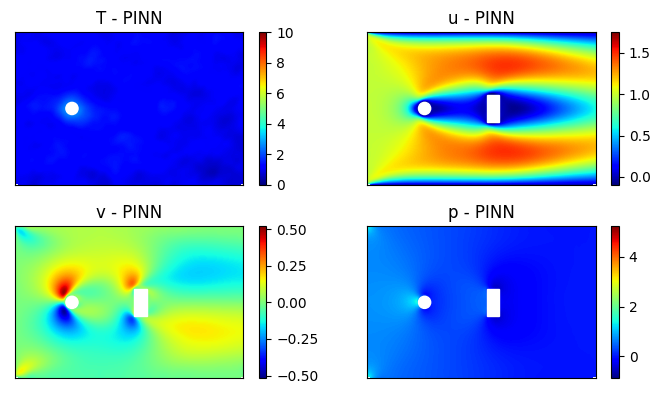

Epoch: 22000 Loss: 80.93239594 Loss1: 0.02023909 Loss2: 80.91215515


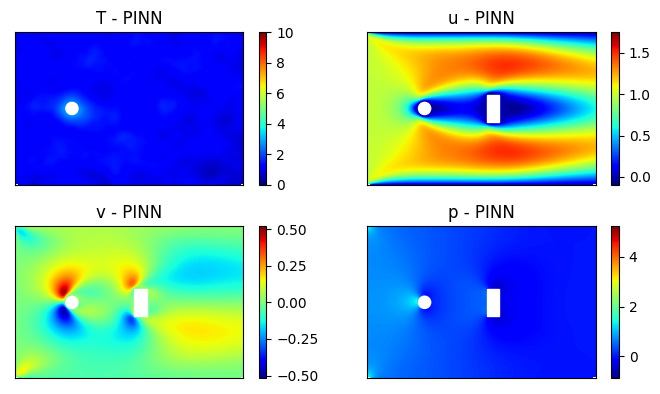

Epoch: 22500 Loss: 66.72586823 Loss1: 0.01706748 Loss2: 66.70880127


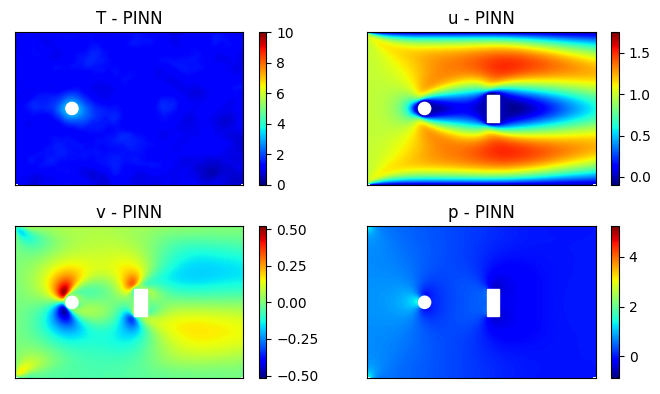

Epoch: 23000 Loss: 66.01974487 Loss1: 0.01679736 Loss2: 66.00294495


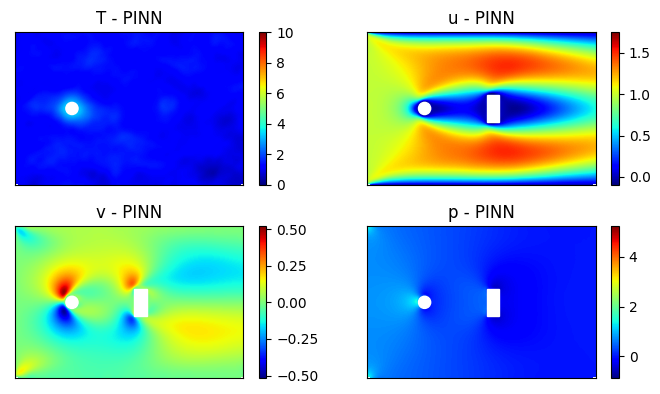

Epoch: 23500 Loss: 78.89211273 Loss1: 0.01784922 Loss2: 78.87425995


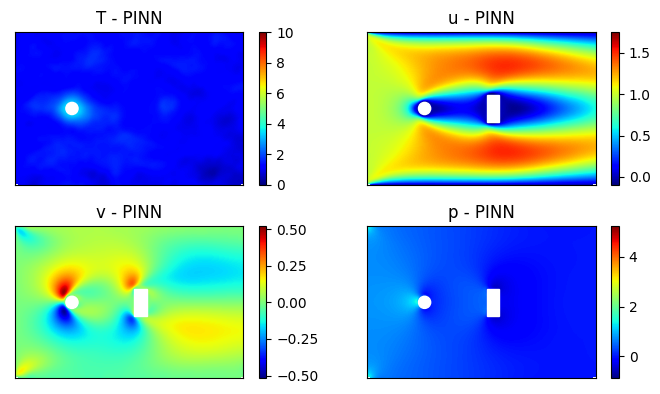

Epoch: 24000 Loss: 56.18023682 Loss1: 0.01734040 Loss2: 56.16289520


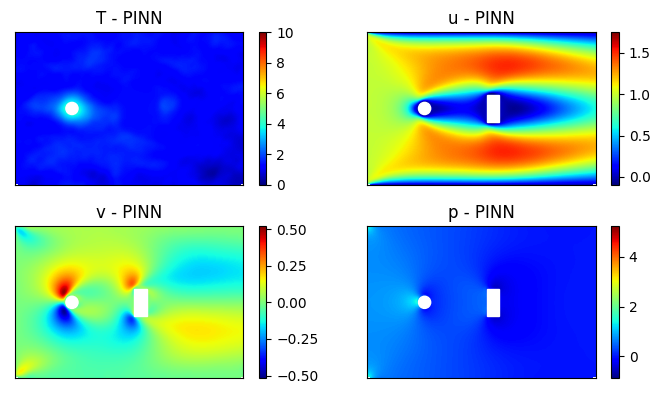

Epoch: 24500 Loss: 50.79233932 Loss1: 0.01685534 Loss2: 50.77548218


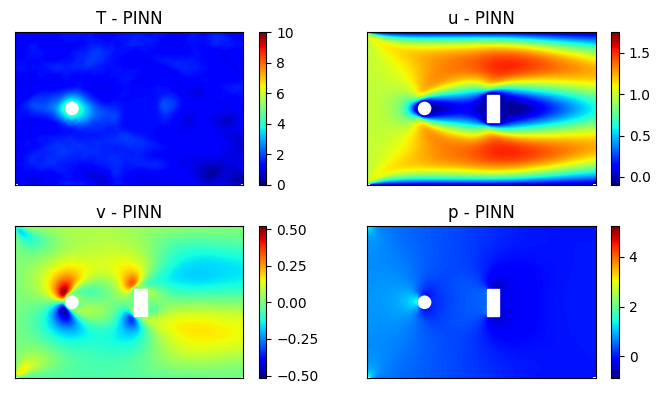

Epoch: 25000 Loss: 48.98001480 Loss1: 0.01696261 Loss2: 48.96305084


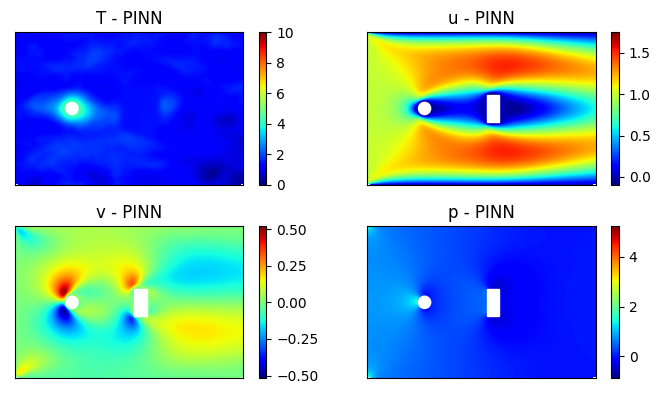

Epoch: 25500 Loss: 39.27588272 Loss1: 0.01534381 Loss2: 39.26054001


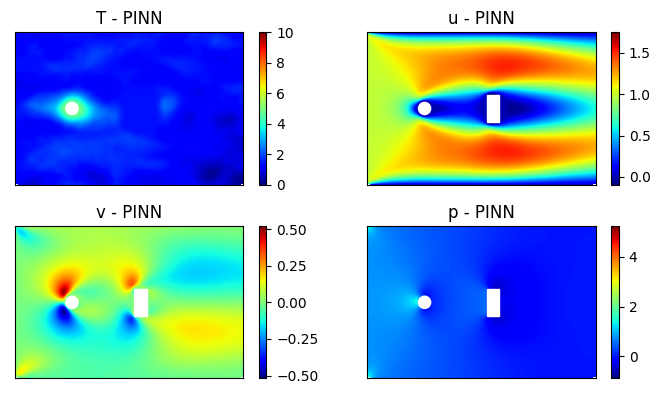

Epoch: 26000 Loss: 37.47356796 Loss1: 0.01431709 Loss2: 37.45925140


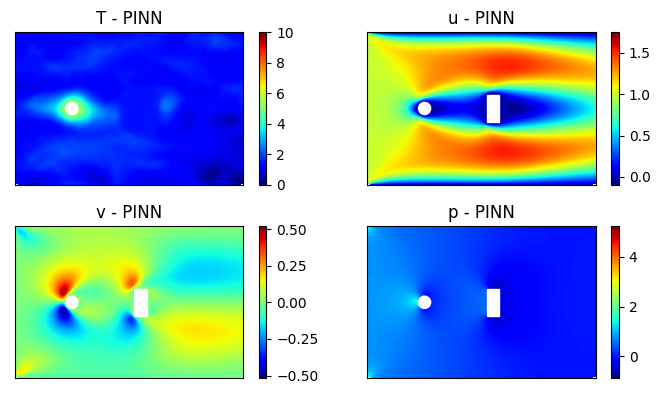

Epoch: 26500 Loss: 37.92652130 Loss1: 0.01685274 Loss2: 37.90966797


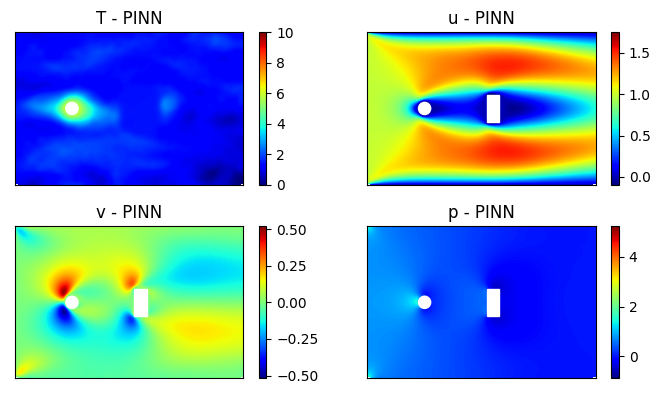

Epoch: 27000 Loss: 28.81400681 Loss1: 0.01617372 Loss2: 28.79783249


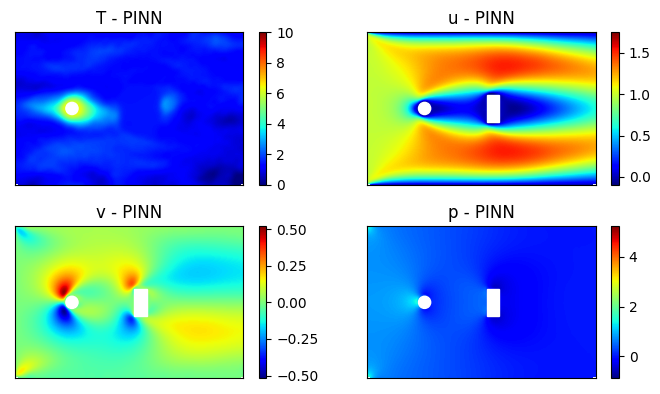

Epoch: 27500 Loss: 22.70935440 Loss1: 0.01497712 Loss2: 22.69437790


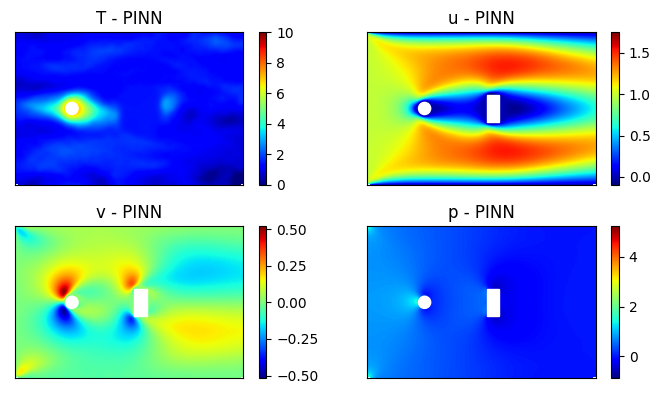

Epoch: 28000 Loss: 21.32492828 Loss1: 0.01545123 Loss2: 21.30947685


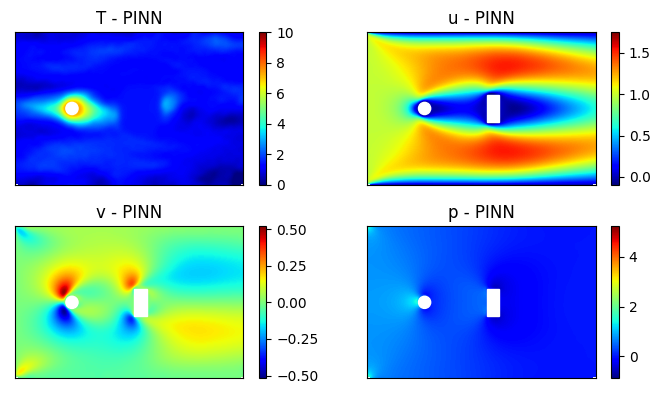

Epoch: 28500 Loss: 19.79648399 Loss1: 0.01669585 Loss2: 19.77978897


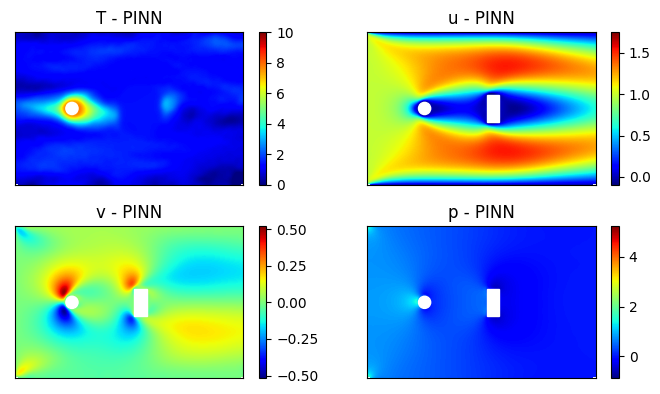

Epoch: 29000 Loss: 14.41124821 Loss1: 0.01620205 Loss2: 14.39504623


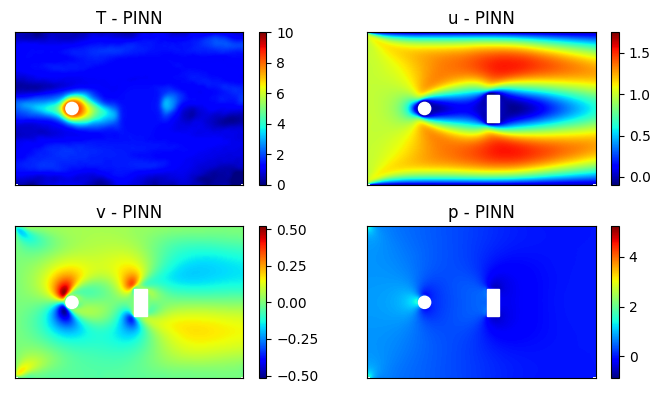

Epoch: 29500 Loss: 12.74648666 Loss1: 0.01442382 Loss2: 12.73206329


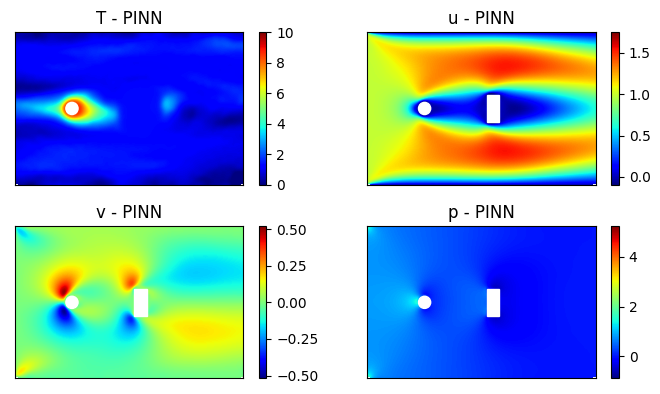

Epoch: 30000 Loss: 10.87379265 Loss1: 0.01437365 Loss2: 10.85941887


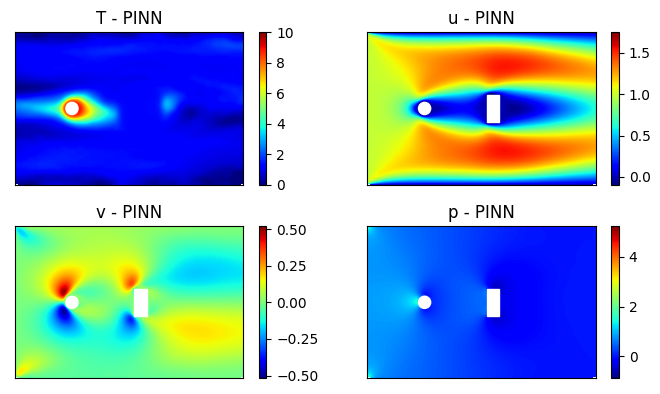

Epoch: 30500 Loss: 8.00217342 Loss1: 0.01286726 Loss2: 7.98930645


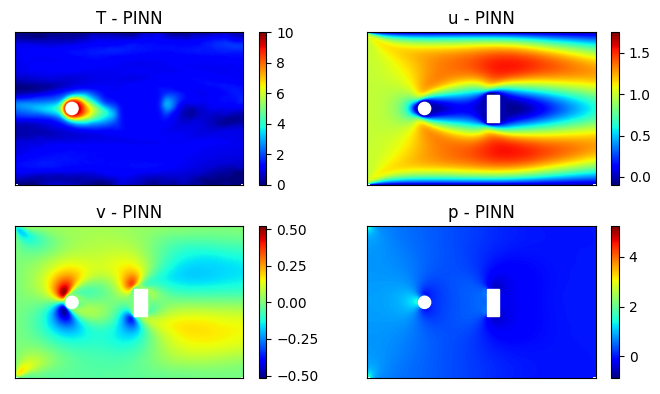

Epoch: 31000 Loss: 6.90006065 Loss1: 0.01636333 Loss2: 6.88369751


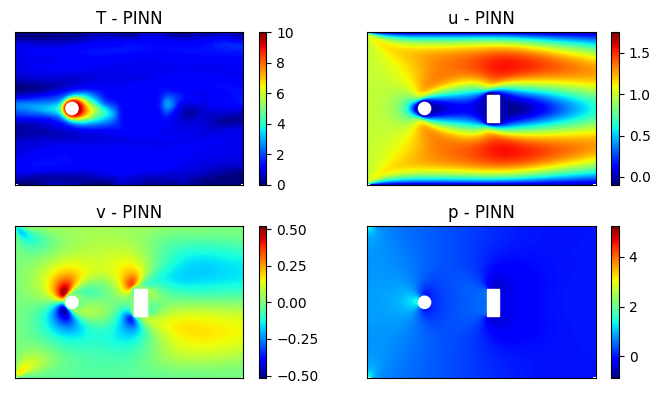

Epoch: 31500 Loss: 5.84957743 Loss1: 0.01256981 Loss2: 5.83700752


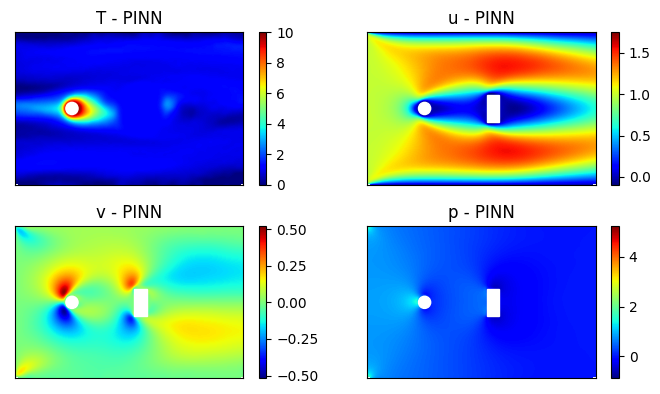

Epoch: 32000 Loss: 8.12892532 Loss1: 0.01285052 Loss2: 8.11607456


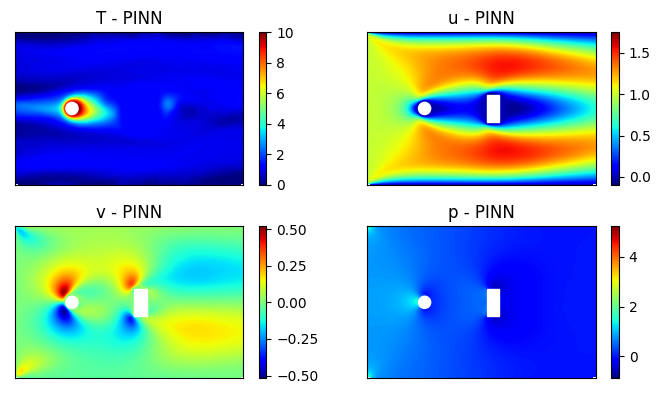

Epoch: 32500 Loss: 4.42191458 Loss1: 0.01440280 Loss2: 4.40751171


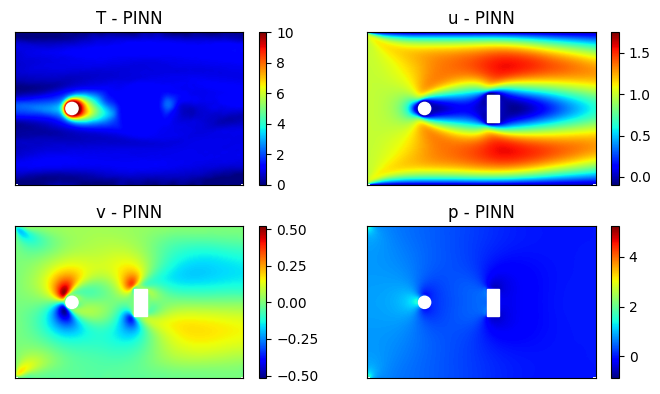

Epoch: 33000 Loss: 4.00342369 Loss1: 0.01722374 Loss2: 3.98619986


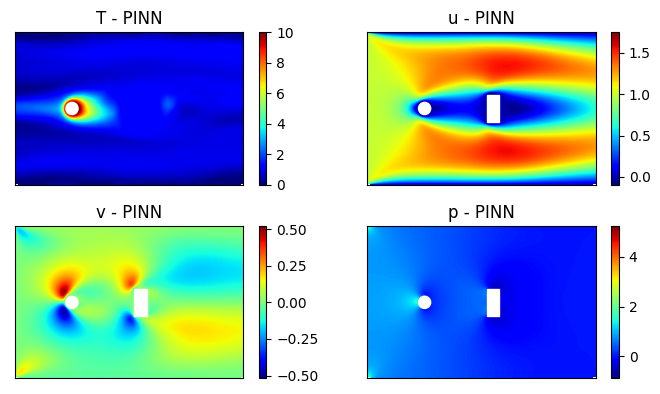

Epoch: 33500 Loss: 3.20522356 Loss1: 0.01219350 Loss2: 3.19303012


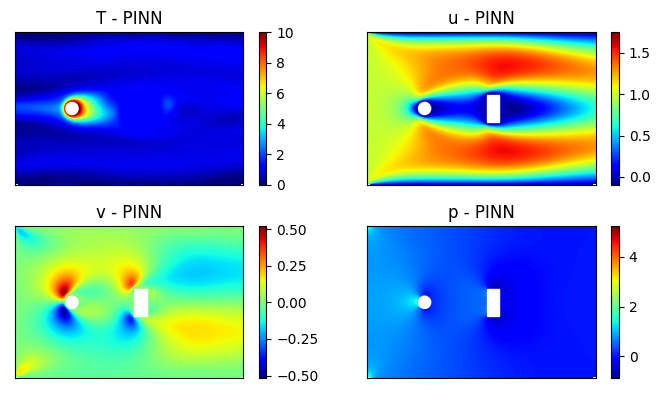

Epoch: 34000 Loss: 3.13018632 Loss1: 0.01132665 Loss2: 3.11885977


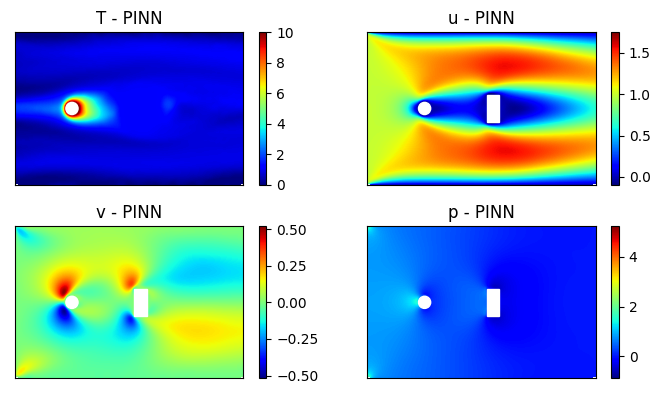

Epoch: 34500 Loss: 2.12759256 Loss1: 0.01368893 Loss2: 2.11390352


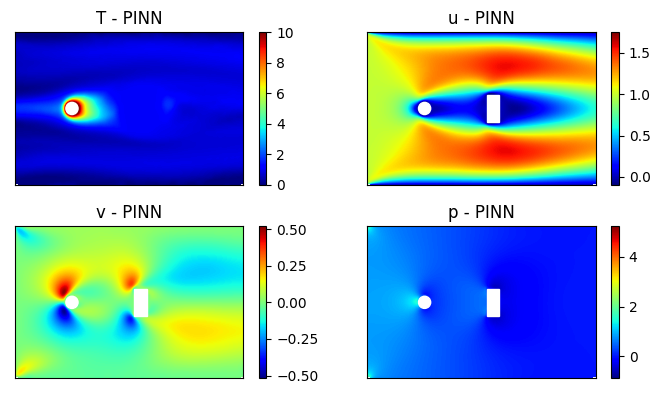

Epoch: 35000 Loss: 1.96138775 Loss1: 0.01087773 Loss2: 1.95051003


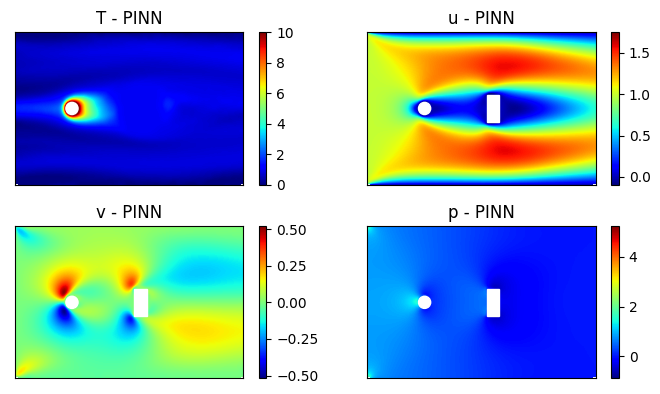

Epoch: 35500 Loss: 2.38591909 Loss1: 0.01405976 Loss2: 2.37185931


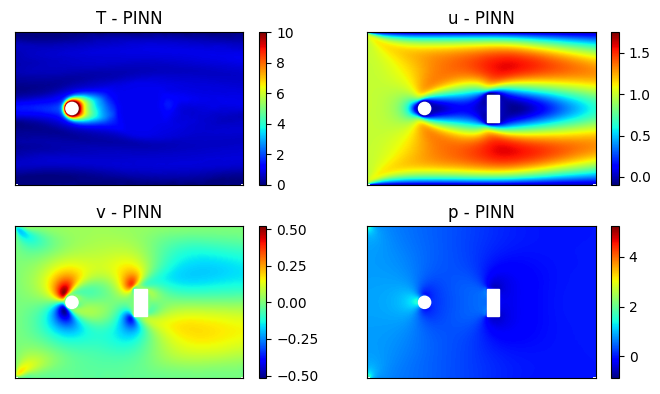

Epoch: 36000 Loss: 2.70187378 Loss1: 0.01055388 Loss2: 2.69131994


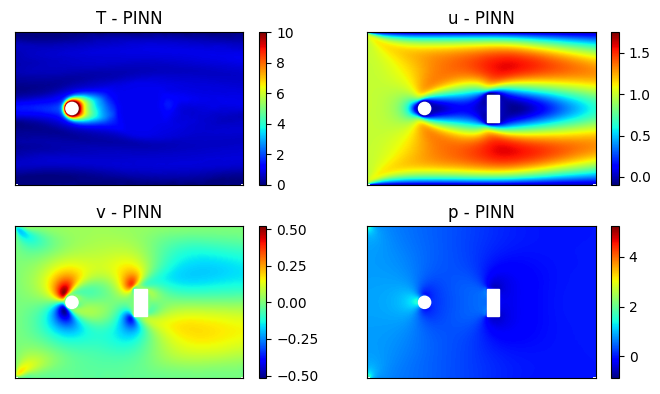

Epoch: 36500 Loss: 1.88311398 Loss1: 0.01345862 Loss2: 1.86965537


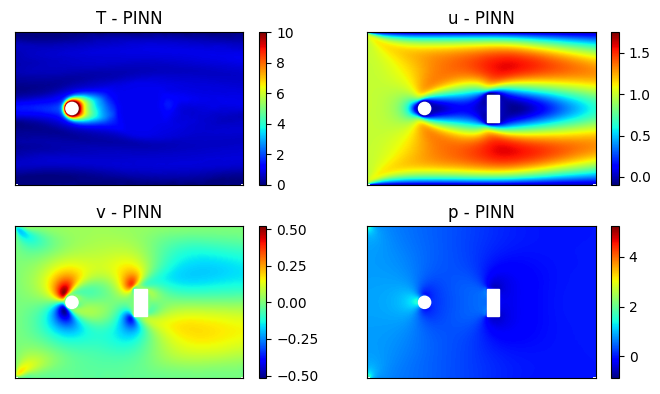

Epoch: 37000 Loss: 1.55182862 Loss1: 0.01549647 Loss2: 1.53633213


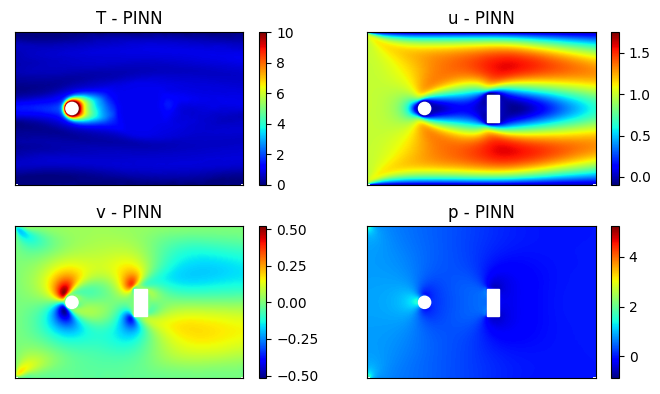

Epoch: 37500 Loss: 1.33364344 Loss1: 0.01154822 Loss2: 1.32209516


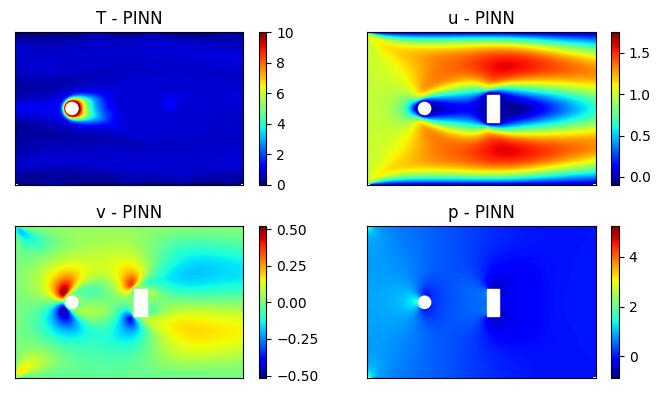

Epoch: 38000 Loss: 1.20494974 Loss1: 0.01432938 Loss2: 1.19062030


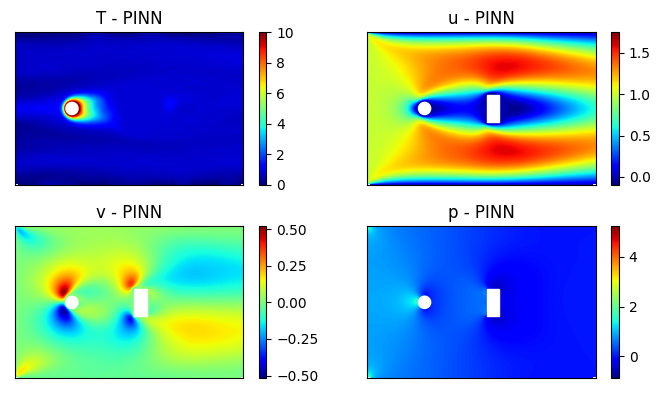

Epoch: 38500 Loss: 1.07875741 Loss1: 0.01245040 Loss2: 1.06630695


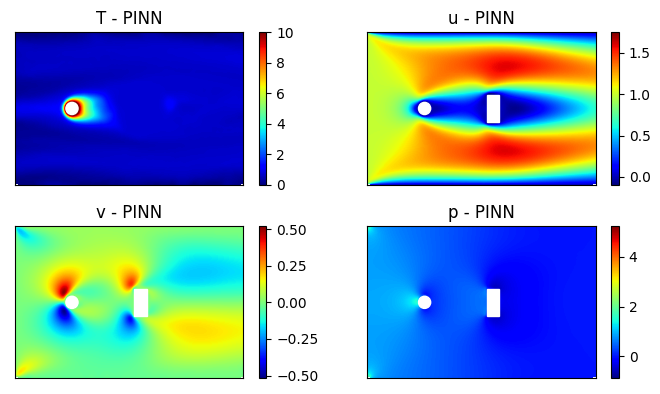

Epoch: 39000 Loss: 0.98876047 Loss1: 0.01195689 Loss2: 0.97680360


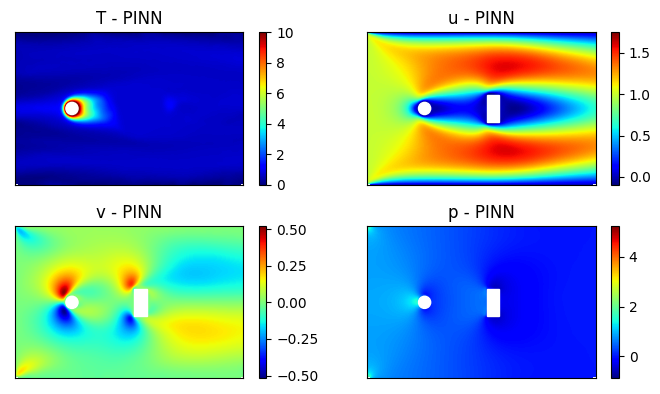

Epoch: 39500 Loss: 0.90880746 Loss1: 0.01191881 Loss2: 0.89688861


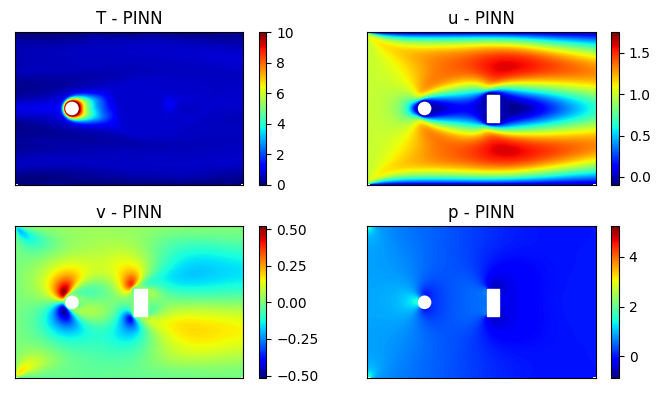

Epoch: 40000 Loss: 0.82999617 Loss1: 0.00945136 Loss2: 0.82054478


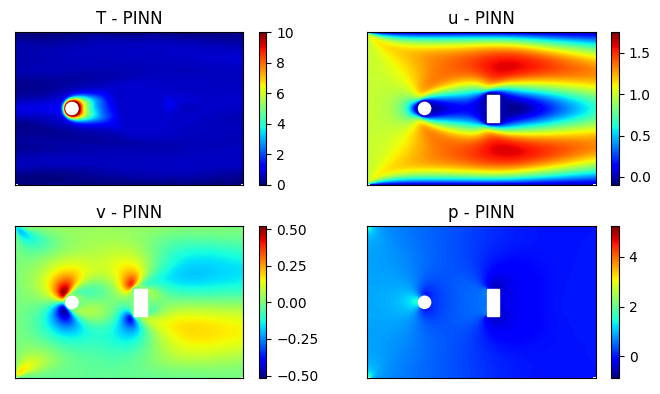

Epoch: 40500 Loss: 0.81182766 Loss1: 0.01015068 Loss2: 0.80167699


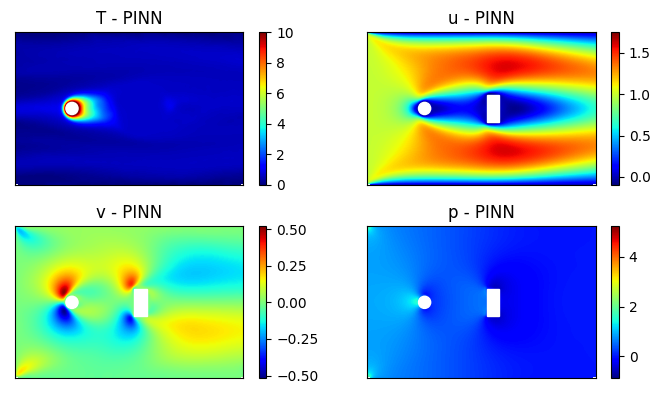

Epoch: 41000 Loss: 0.72845590 Loss1: 0.01155530 Loss2: 0.71690059


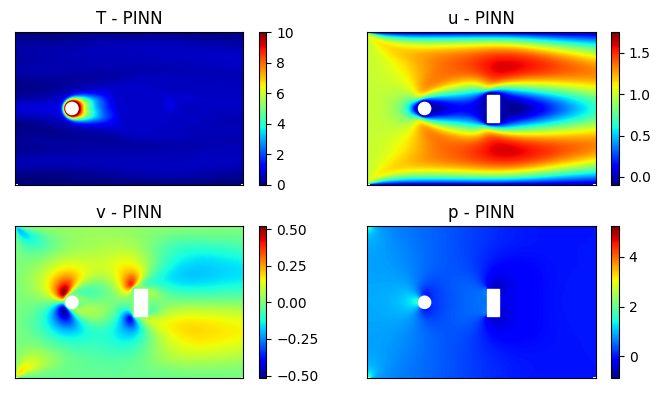

Epoch: 41500 Loss: 0.83211434 Loss1: 0.01026000 Loss2: 0.82185435


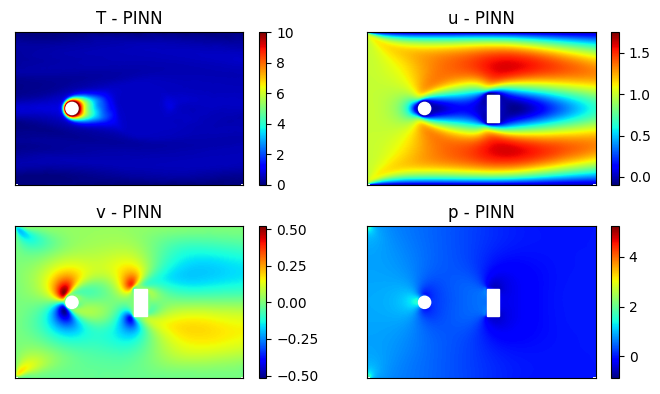

Epoch: 42000 Loss: 0.67675459 Loss1: 0.01094184 Loss2: 0.66581273


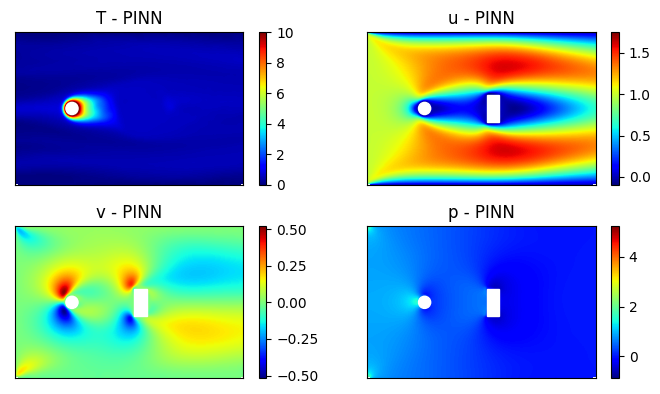

Epoch: 42500 Loss: 0.68203896 Loss1: 0.01257838 Loss2: 0.66946059


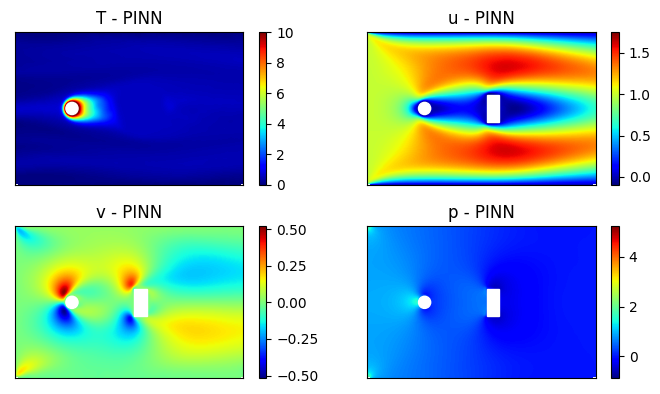

Epoch: 43000 Loss: 0.55268562 Loss1: 0.01112274 Loss2: 0.54156286


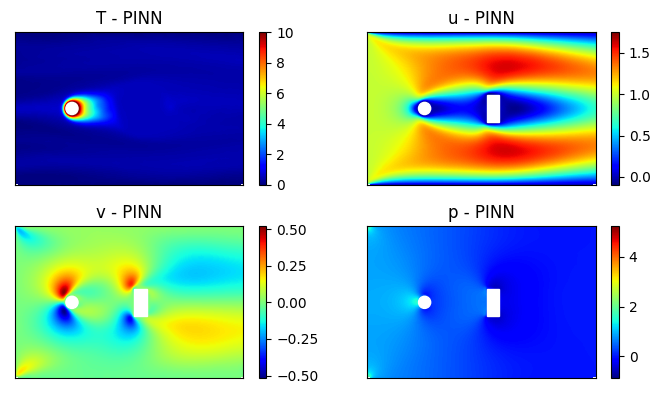

Epoch: 43500 Loss: 0.52295244 Loss1: 0.01145213 Loss2: 0.51150030


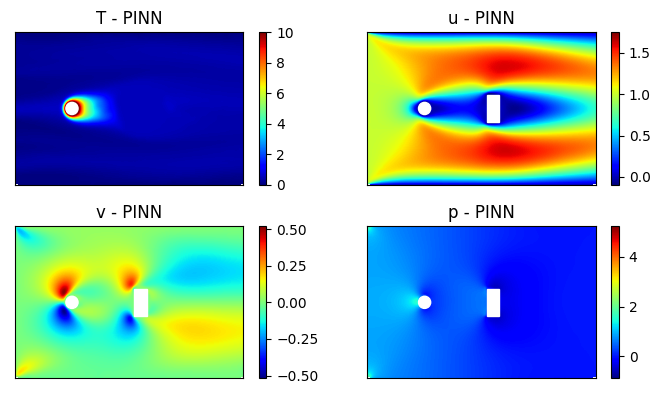

Epoch: 44000 Loss: 0.45560476 Loss1: 0.01123951 Loss2: 0.44436526


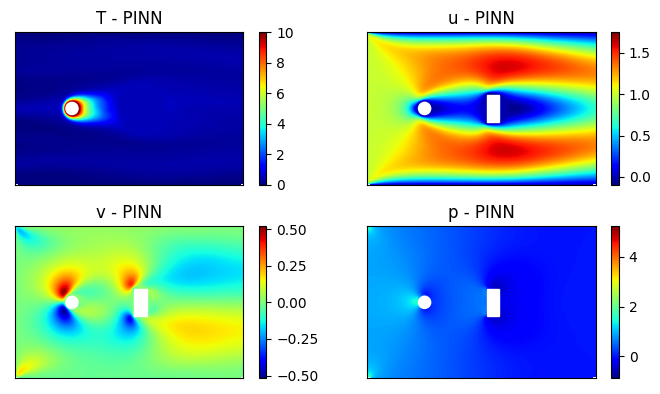

Epoch: 44500 Loss: 0.46252647 Loss1: 0.00891300 Loss2: 0.45361346


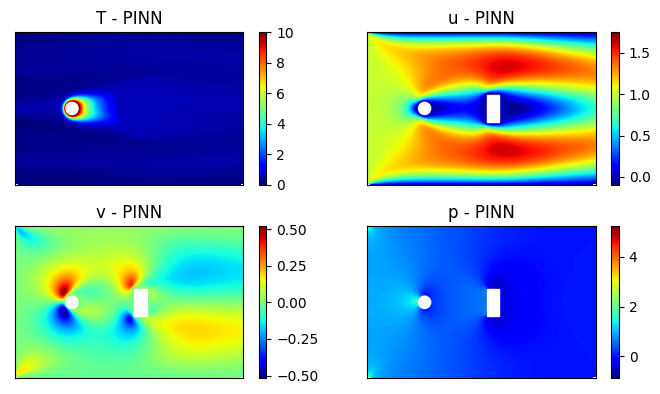

Epoch: 45000 Loss: 0.52817601 Loss1: 0.00775369 Loss2: 0.52042234


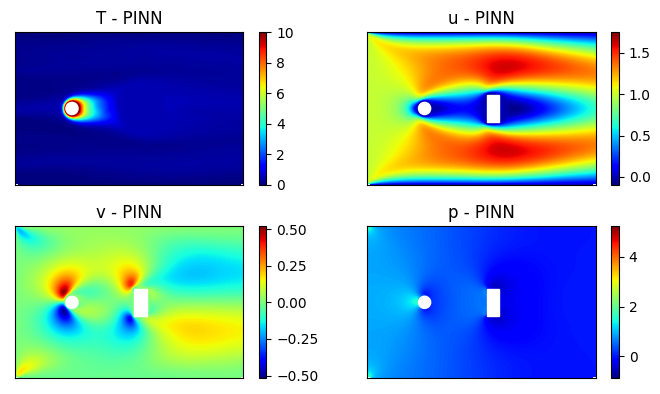

Epoch: 45500 Loss: 0.38616833 Loss1: 0.01033406 Loss2: 0.37583429


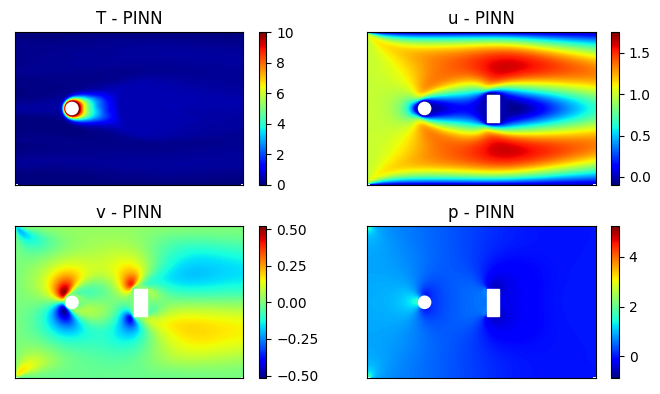

Epoch: 46000 Loss: 0.35793674 Loss1: 0.01231412 Loss2: 0.34562263


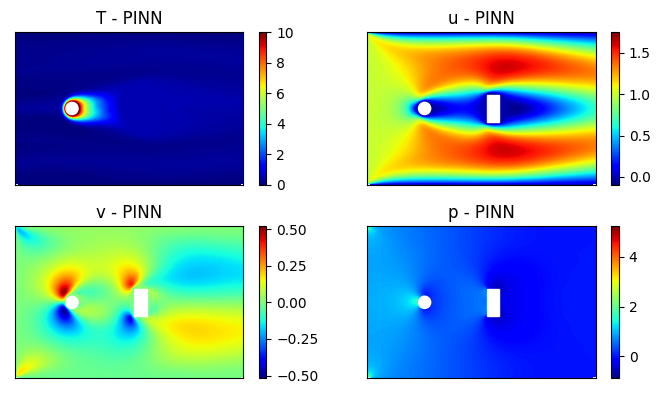

Epoch: 46500 Loss: 0.39990231 Loss1: 0.01100054 Loss2: 0.38890177


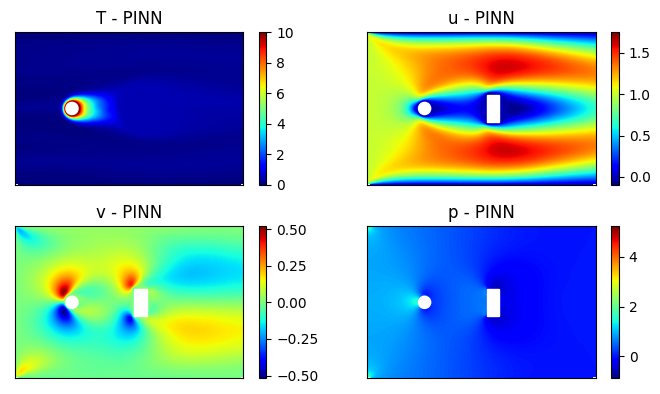

Epoch: 47000 Loss: 0.33912939 Loss1: 0.00804145 Loss2: 0.33108795


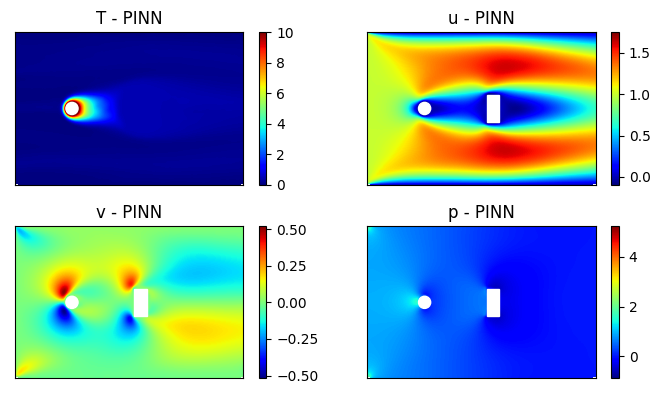

Epoch: 47500 Loss: 0.35362741 Loss1: 0.00806418 Loss2: 0.34556323


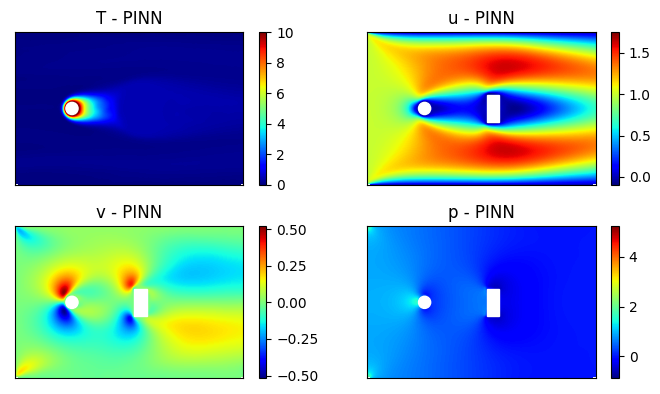

Epoch: 48000 Loss: 0.67615515 Loss1: 0.00990672 Loss2: 0.66624844


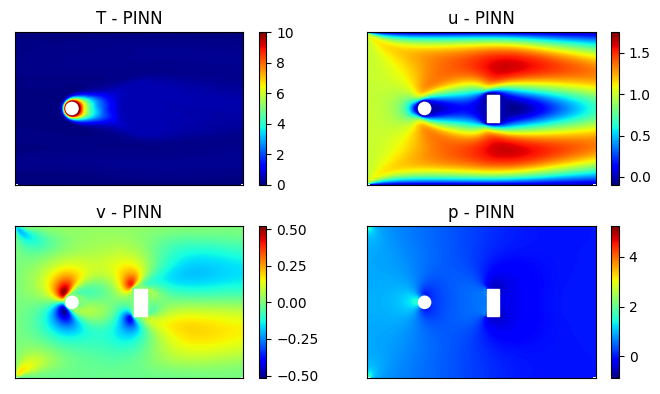

Epoch: 48500 Loss: 0.48423538 Loss1: 0.00726196 Loss2: 0.47697341


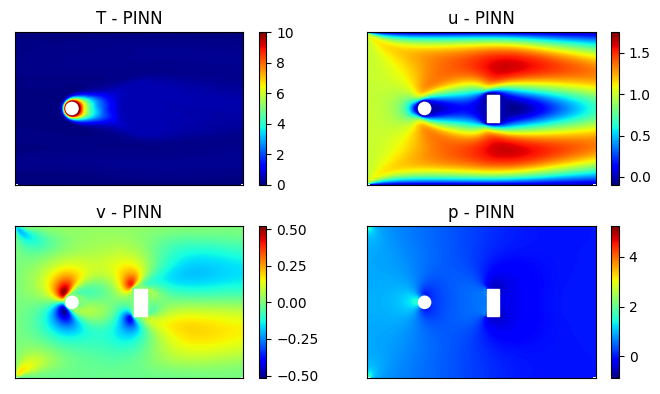

Epoch: 49000 Loss: 0.43214819 Loss1: 0.00913862 Loss2: 0.42300957


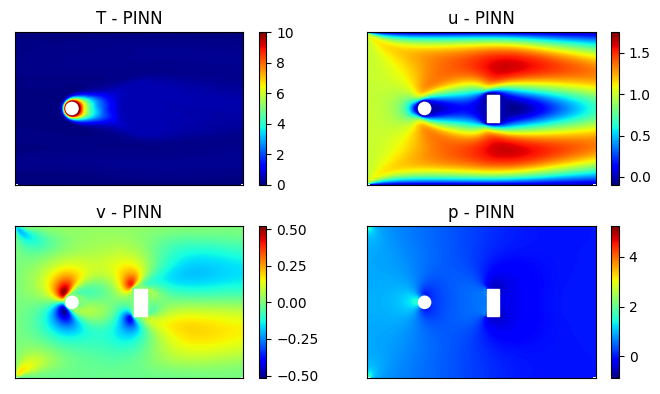

Epoch: 49500 Loss: 0.37343901 Loss1: 0.00799662 Loss2: 0.36544240


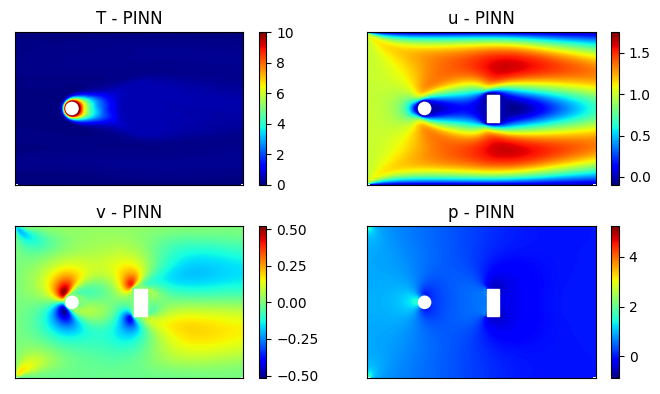

Epoch: 50000 Loss: 0.37010083 Loss1: 0.01003959 Loss2: 0.36006123


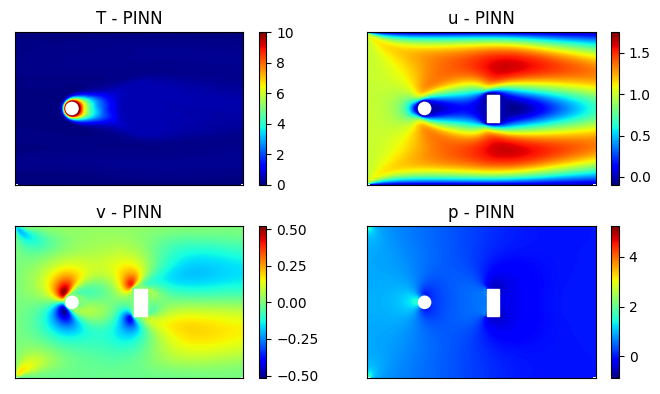

Epoch: 50500 Loss: 0.34218585 Loss1: 0.00770430 Loss2: 0.33448157


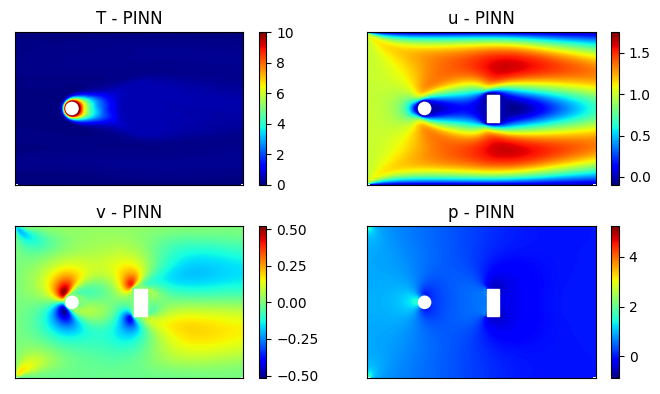

Epoch: 51000 Loss: 0.32509395 Loss1: 0.00728351 Loss2: 0.31781045


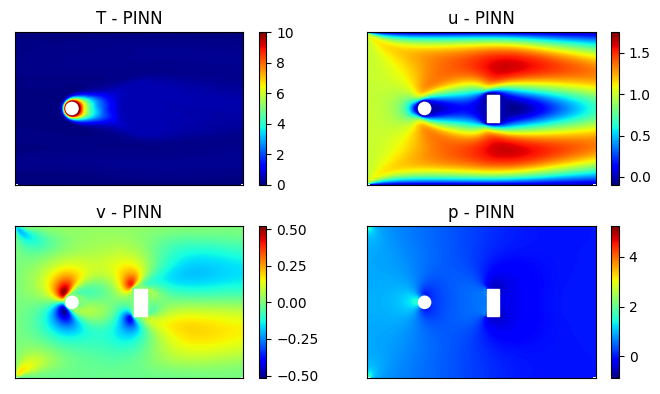

Epoch: 51500 Loss: 0.30402926 Loss1: 0.00785884 Loss2: 0.29617041


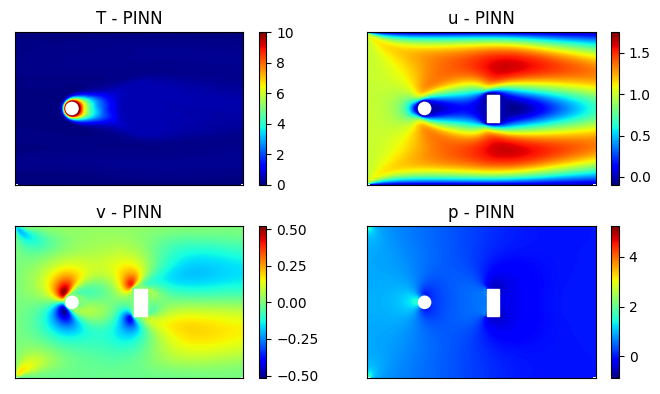

Epoch: 52000 Loss: 0.29222187 Loss1: 0.00739019 Loss2: 0.28483167


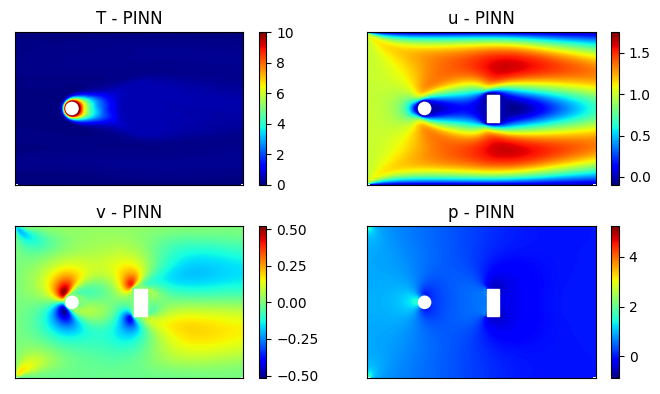

Epoch: 52500 Loss: 0.27590230 Loss1: 0.00789674 Loss2: 0.26800555


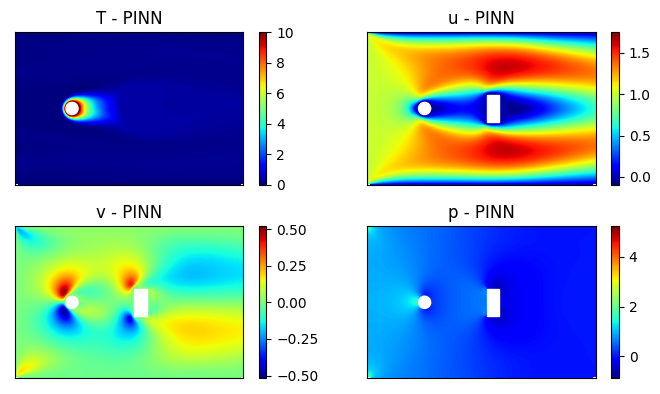

Epoch: 53000 Loss: 0.27814549 Loss1: 0.01040233 Loss2: 0.26774317


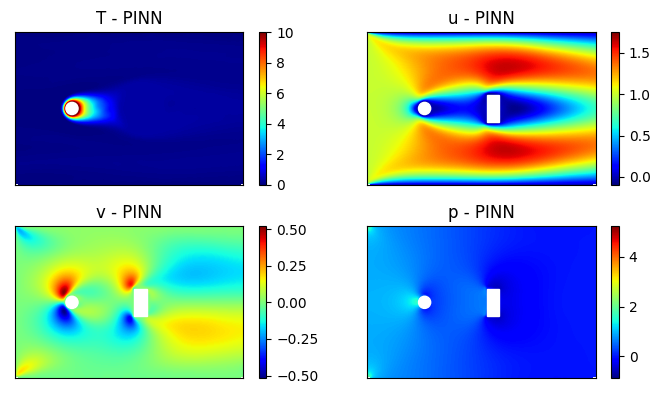

Epoch: 53500 Loss: 0.27516249 Loss1: 0.00937507 Loss2: 0.26578742


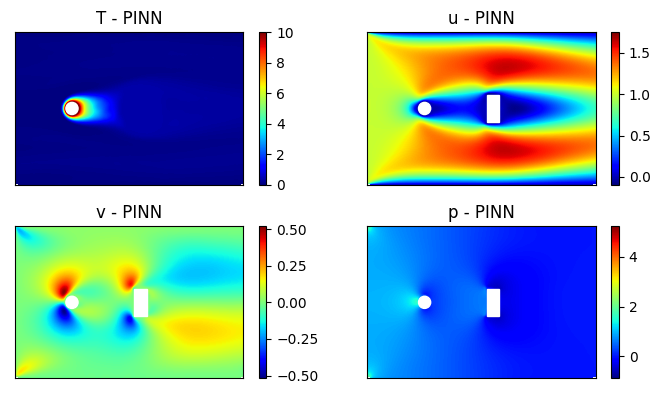

Epoch: 54000 Loss: 0.27732465 Loss1: 0.00725108 Loss2: 0.27007356


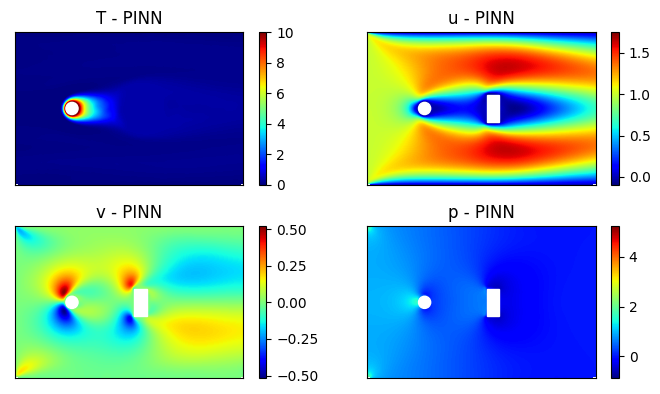

Epoch: 54500 Loss: 0.26743183 Loss1: 0.00825953 Loss2: 0.25917229


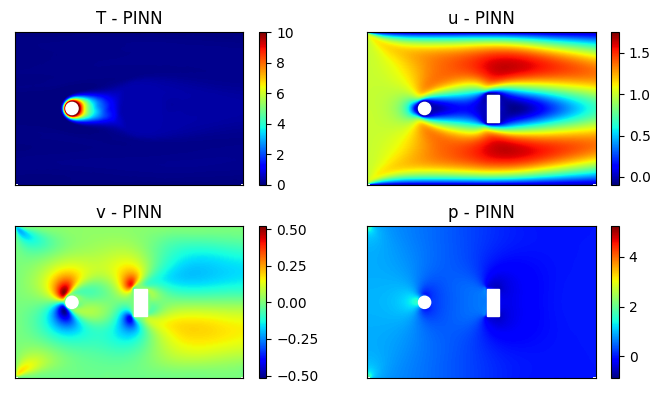

Epoch: 55000 Loss: 0.24649282 Loss1: 0.00778459 Loss2: 0.23870823


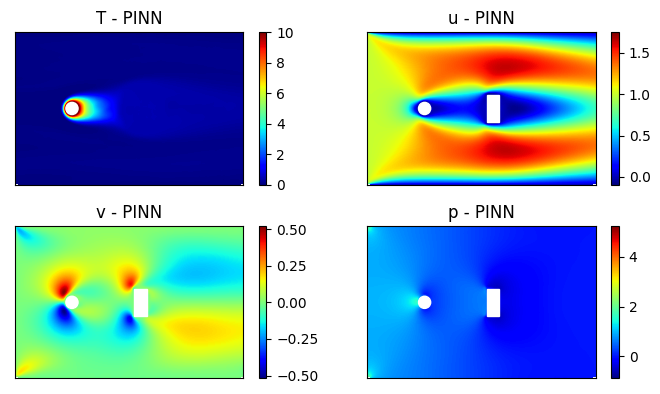

Epoch: 55500 Loss: 0.27091002 Loss1: 0.00783280 Loss2: 0.26307723


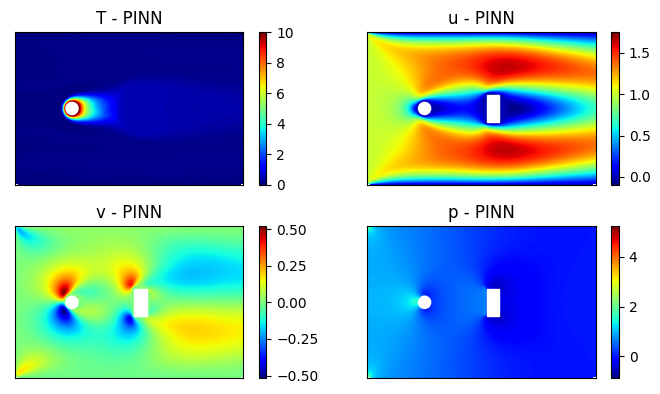

Epoch: 56000 Loss: 0.23328555 Loss1: 0.00817956 Loss2: 0.22510599


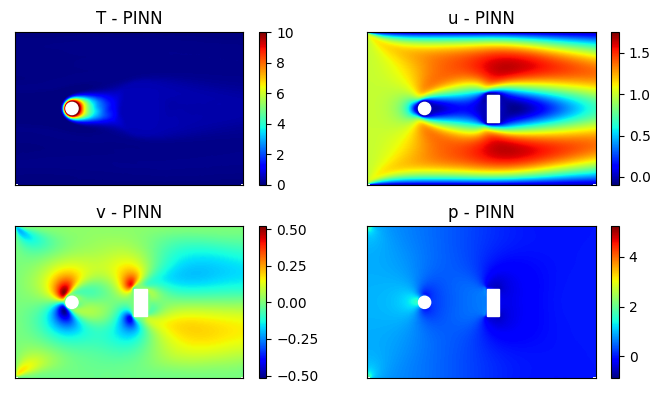

Epoch: 56500 Loss: 0.22763246 Loss1: 0.00687070 Loss2: 0.22076176


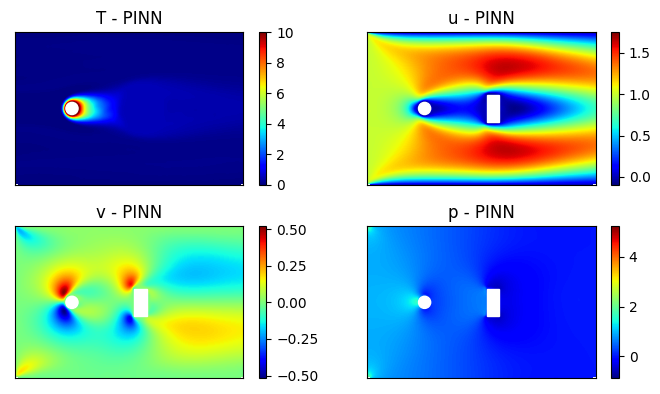

Epoch: 57000 Loss: 0.54611170 Loss1: 0.00699672 Loss2: 0.53911501


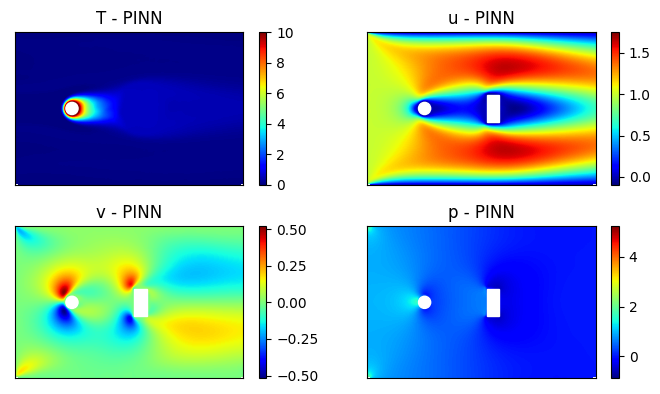

Epoch: 57500 Loss: 0.46639350 Loss1: 0.00623302 Loss2: 0.46016049


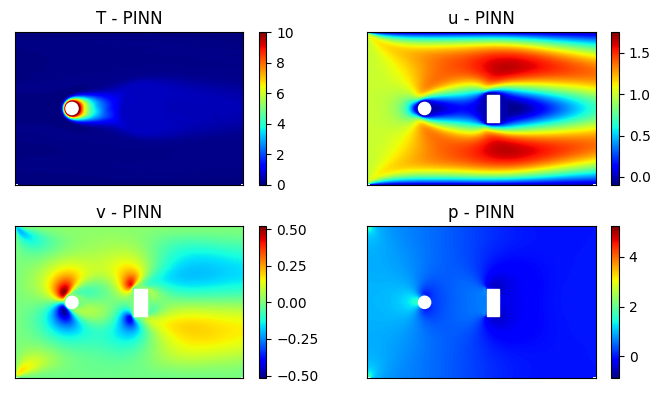

Epoch: 58000 Loss: 0.26929736 Loss1: 0.00597205 Loss2: 0.26332530


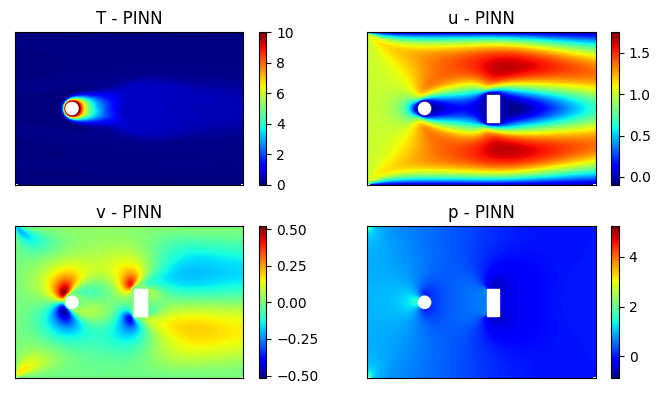

Epoch: 58500 Loss: 0.24494460 Loss1: 0.00816999 Loss2: 0.23677461


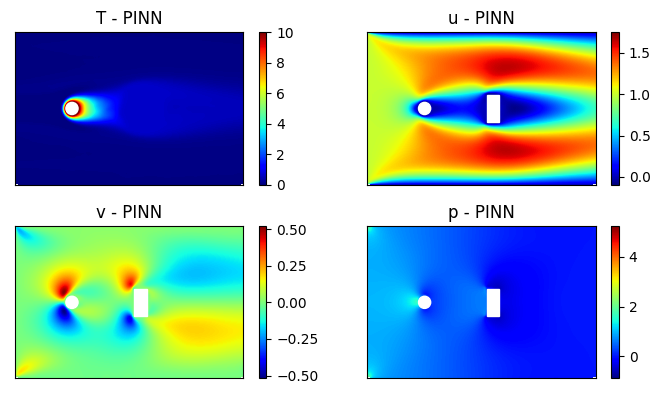

Epoch: 59000 Loss: 0.19654851 Loss1: 0.00694489 Loss2: 0.18960361


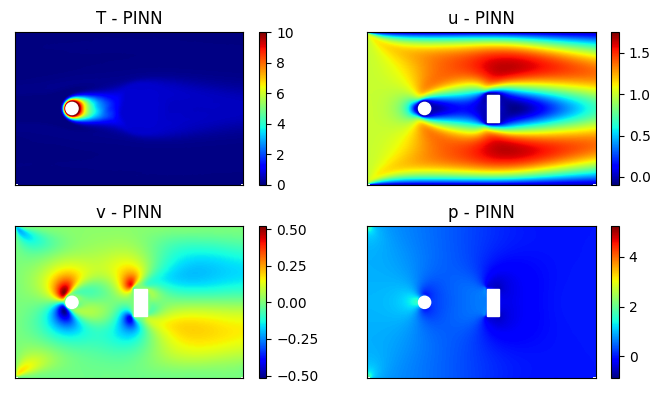

Epoch: 59500 Loss: 0.25215447 Loss1: 0.01057028 Loss2: 0.24158420


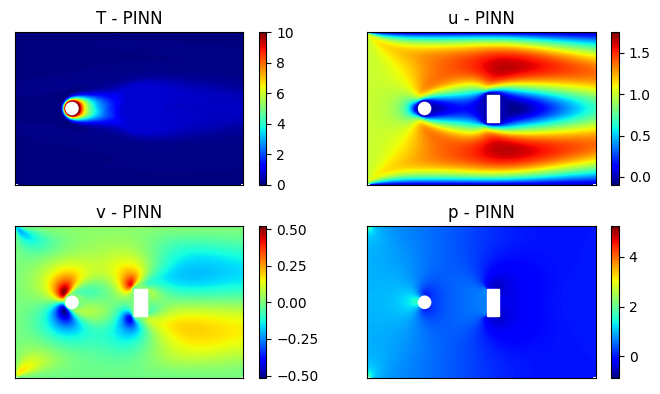

Epoch: 60000 Loss: 0.17329645 Loss1: 0.00826396 Loss2: 0.16503249


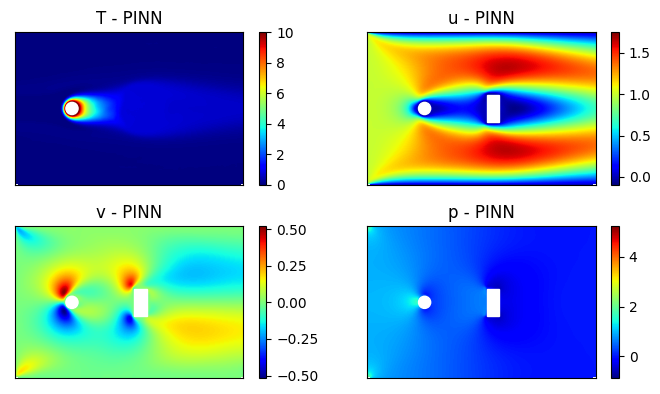

Epoch: 60500 Loss: 0.16645779 Loss1: 0.00630870 Loss2: 0.16014910


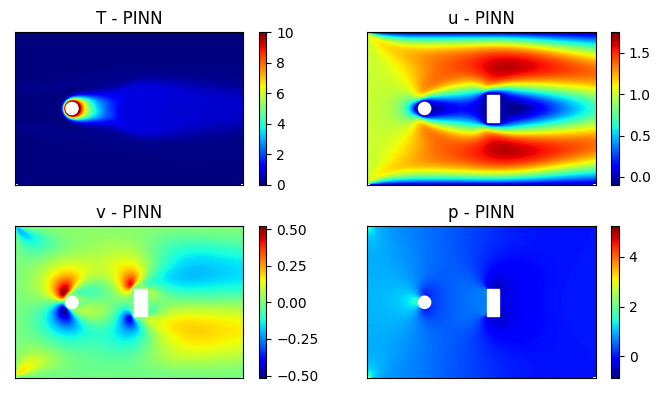

Epoch: 61000 Loss: 0.16512154 Loss1: 0.00691521 Loss2: 0.15820633


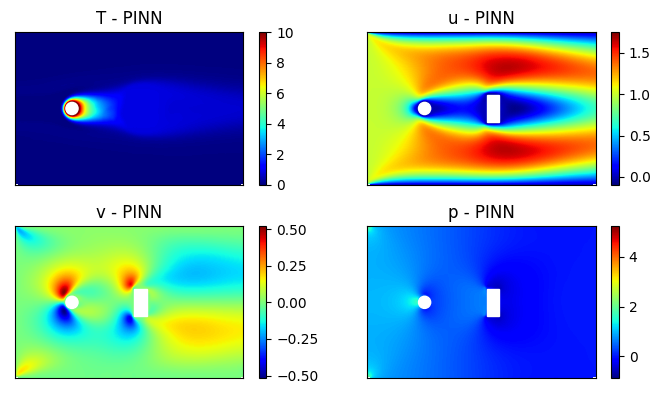

Epoch: 61500 Loss: 0.15954624 Loss1: 0.00775711 Loss2: 0.15178913


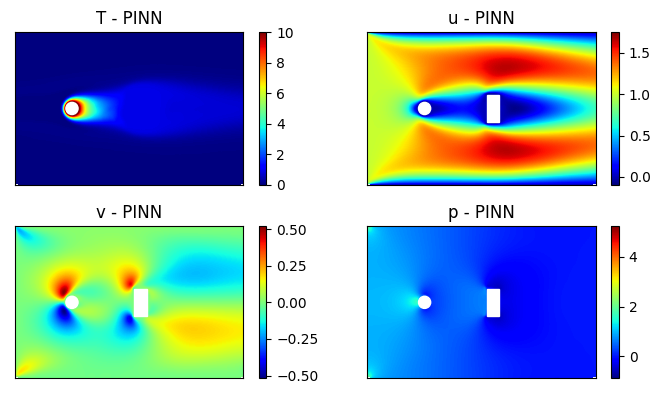

Epoch: 62000 Loss: 0.20015825 Loss1: 0.00752508 Loss2: 0.19263317


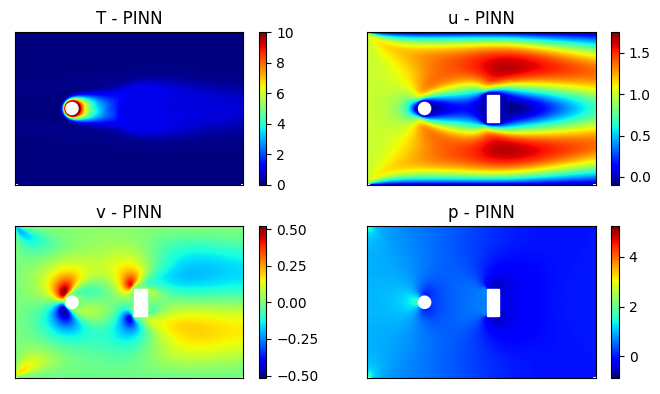

Epoch: 62500 Loss: 0.60089046 Loss1: 0.00700812 Loss2: 0.59388232


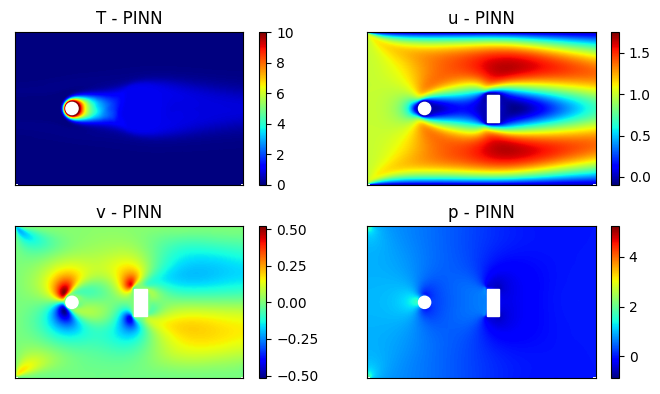

Epoch: 63000 Loss: 0.21016076 Loss1: 0.00737561 Loss2: 0.20278515


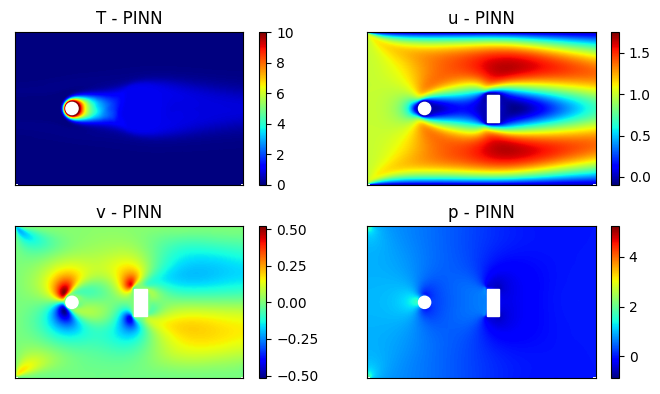

Epoch: 63500 Loss: 0.19183256 Loss1: 0.00877853 Loss2: 0.18305403


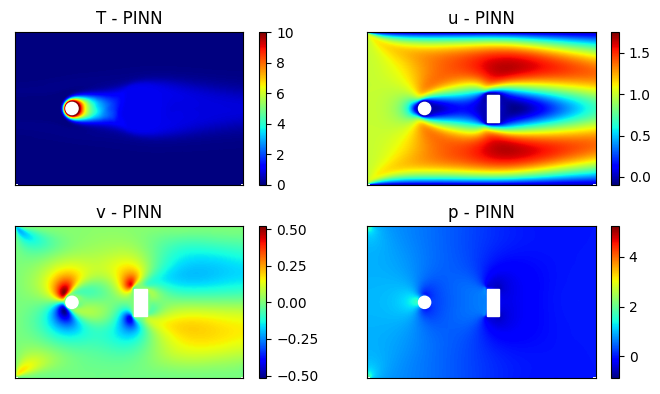

Epoch: 64000 Loss: 0.18843326 Loss1: 0.00798883 Loss2: 0.18044442


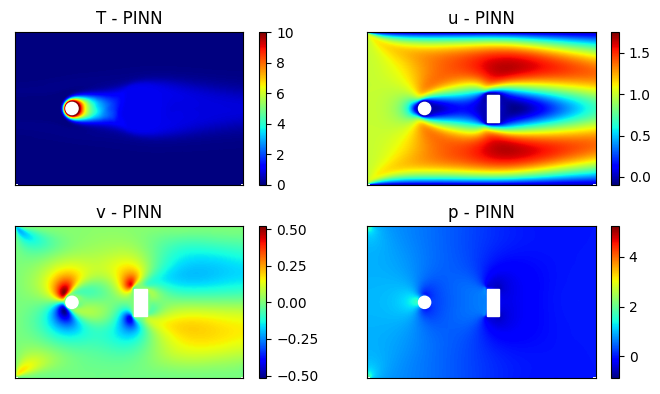

Epoch: 64500 Loss: 0.20321342 Loss1: 0.00517989 Loss2: 0.19803354


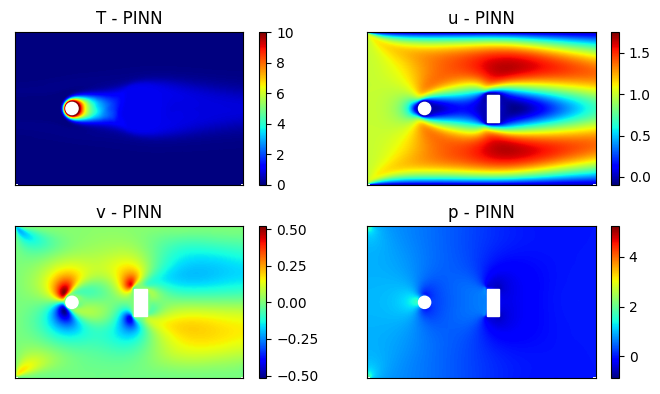

Epoch: 65000 Loss: 0.19513935 Loss1: 0.00588483 Loss2: 0.18925452


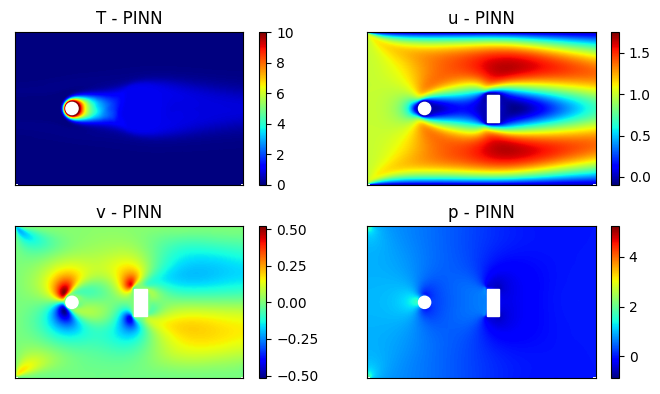

Epoch: 65500 Loss: 0.14479794 Loss1: 0.00493283 Loss2: 0.13986510


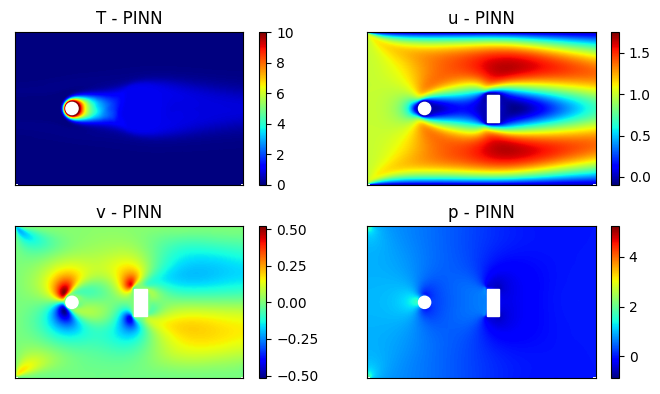

Epoch: 66000 Loss: 0.15340269 Loss1: 0.00570625 Loss2: 0.14769644


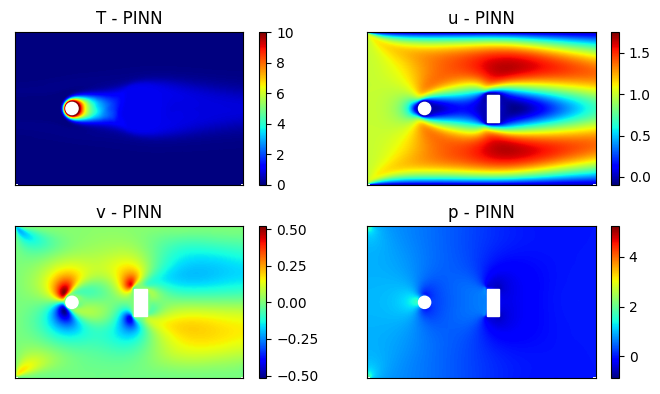

Epoch: 66500 Loss: 0.14178410 Loss1: 0.00457108 Loss2: 0.13721302


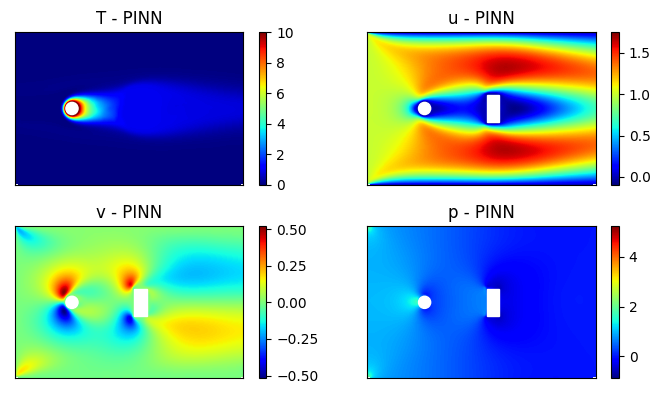

Epoch: 67000 Loss: 0.14999534 Loss1: 0.00622514 Loss2: 0.14377020


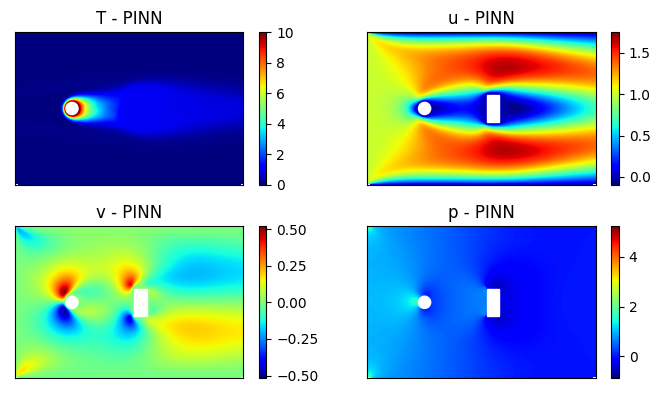

Epoch: 67500 Loss: 0.16017227 Loss1: 0.00763980 Loss2: 0.15253247


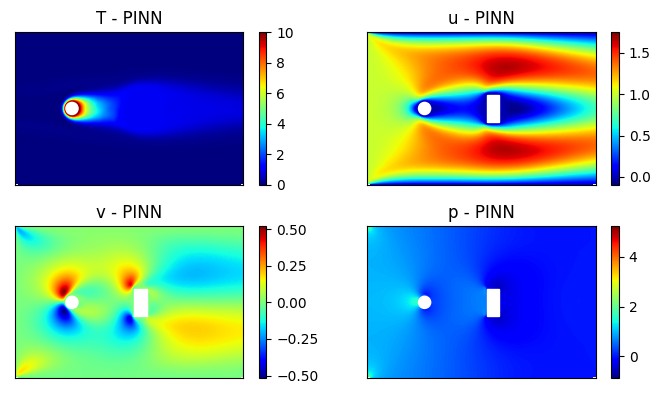

Epoch: 68000 Loss: 0.36528617 Loss1: 0.00539981 Loss2: 0.35988635


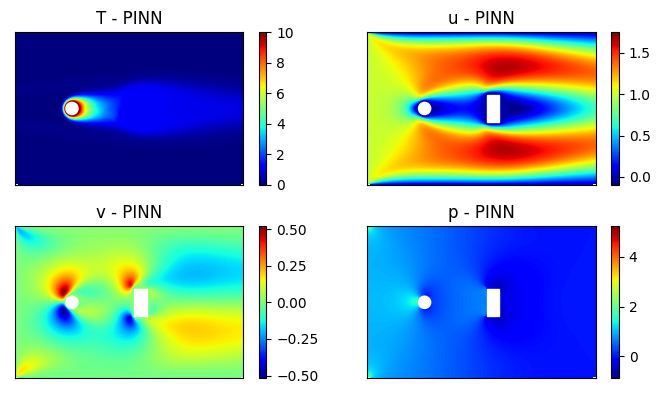

Epoch: 68500 Loss: 0.12827110 Loss1: 0.00663920 Loss2: 0.12163191


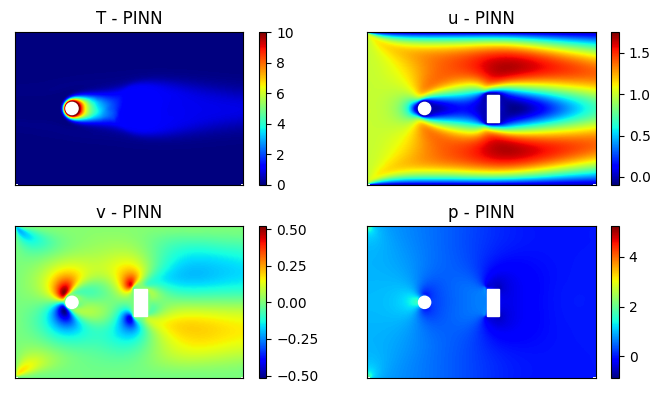

Epoch: 69000 Loss: 0.11305552 Loss1: 0.00468527 Loss2: 0.10837025


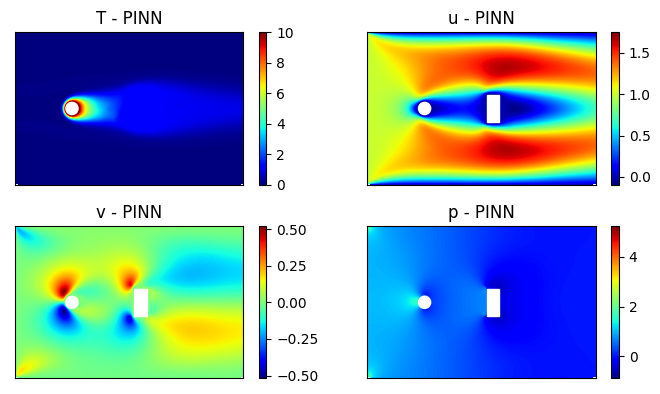

Epoch: 69500 Loss: 0.15601899 Loss1: 0.00863975 Loss2: 0.14737923


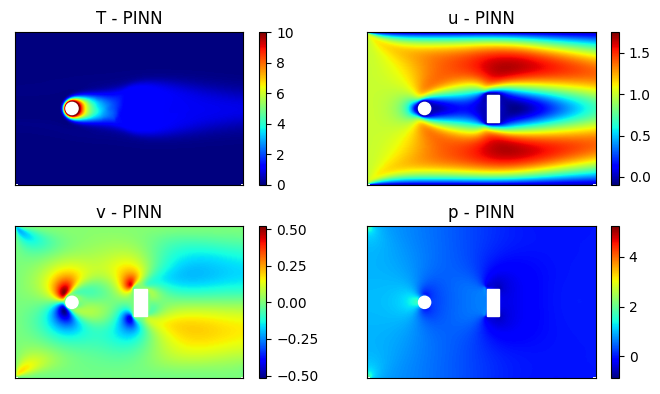

Epoch: 70000 Loss: 0.10902862 Loss1: 0.00604115 Loss2: 0.10298746


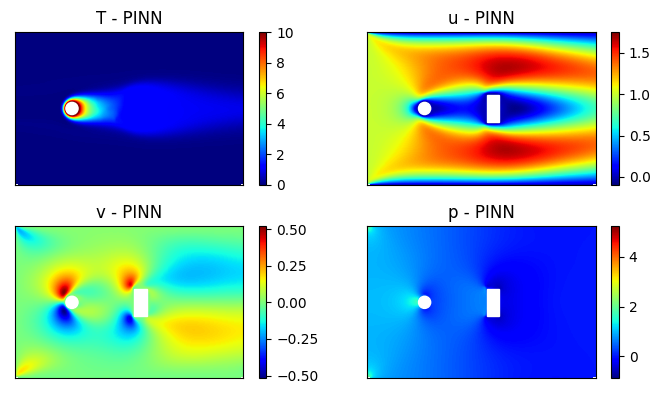

Epoch: 70500 Loss: 0.12371557 Loss1: 0.00451851 Loss2: 0.11919706


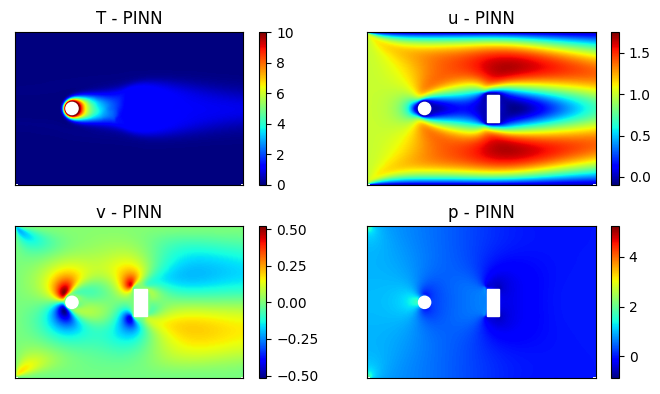

Epoch: 71000 Loss: 0.09393679 Loss1: 0.00551370 Loss2: 0.08842310


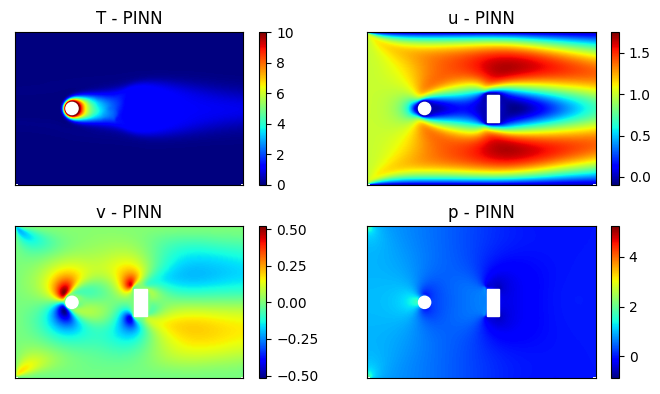

Epoch: 71500 Loss: 0.12526262 Loss1: 0.00661185 Loss2: 0.11865076


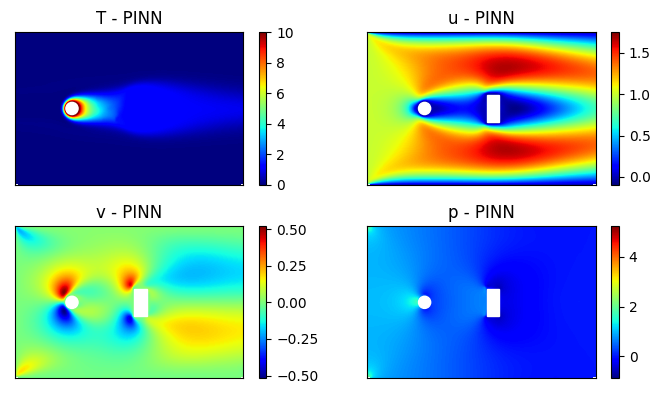

Epoch: 72000 Loss: 0.09318875 Loss1: 0.00540905 Loss2: 0.08777970


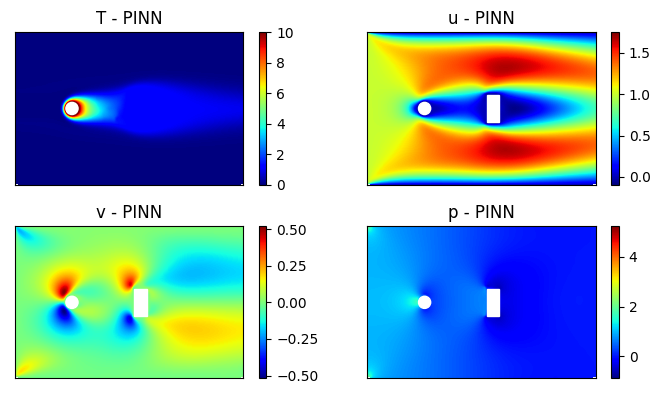

Epoch: 72500 Loss: 0.15643938 Loss1: 0.00530294 Loss2: 0.15113644


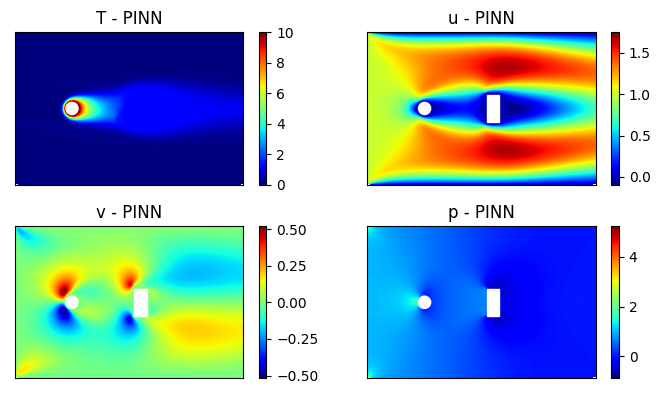

Epoch: 73000 Loss: 0.10743715 Loss1: 0.00464960 Loss2: 0.10278755


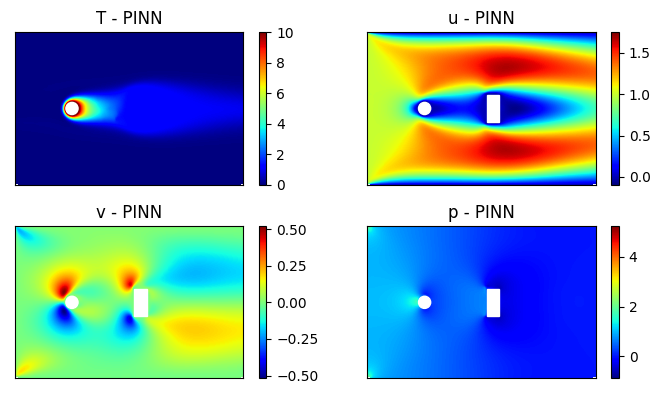

Epoch: 73500 Loss: 0.08759011 Loss1: 0.00446926 Loss2: 0.08312085


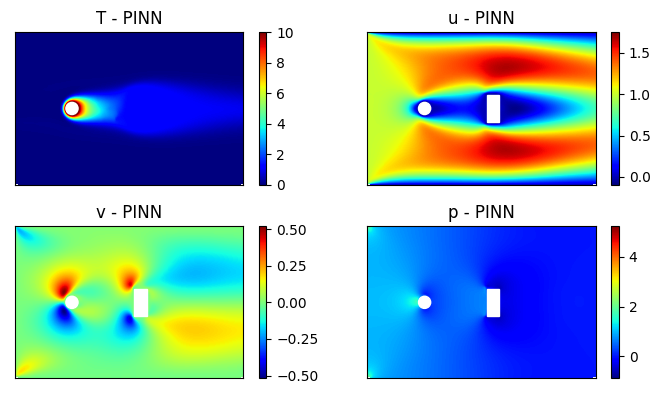

Epoch: 74000 Loss: 0.09120034 Loss1: 0.00473472 Loss2: 0.08646562


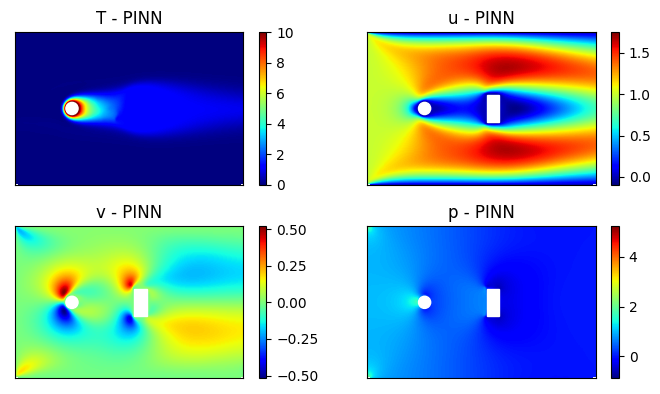

Epoch: 74500 Loss: 0.08448742 Loss1: 0.00432378 Loss2: 0.08016364


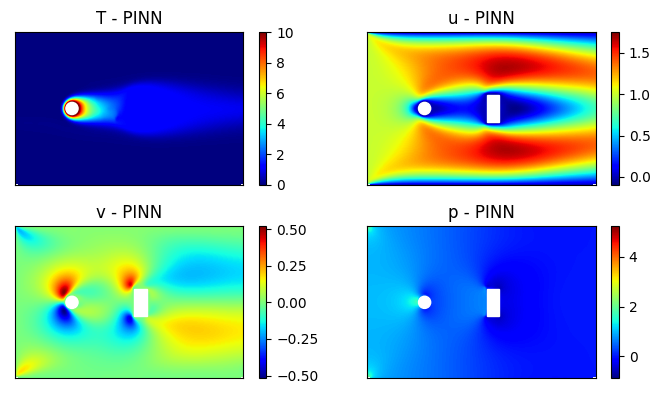

Epoch: 75000 Loss: 0.08398277 Loss1: 0.00396709 Loss2: 0.08001568


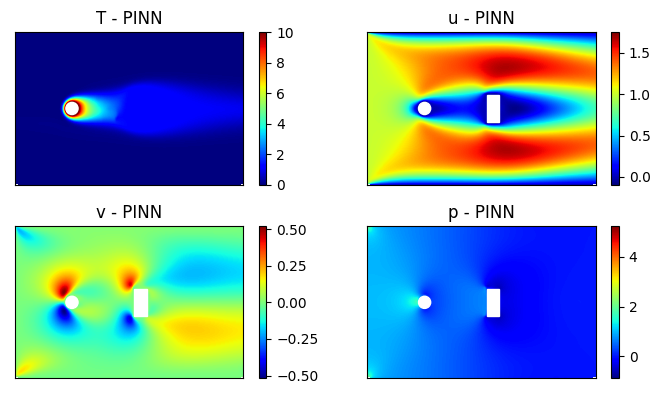

Epoch: 75500 Loss: 0.08780332 Loss1: 0.00502856 Loss2: 0.08277476


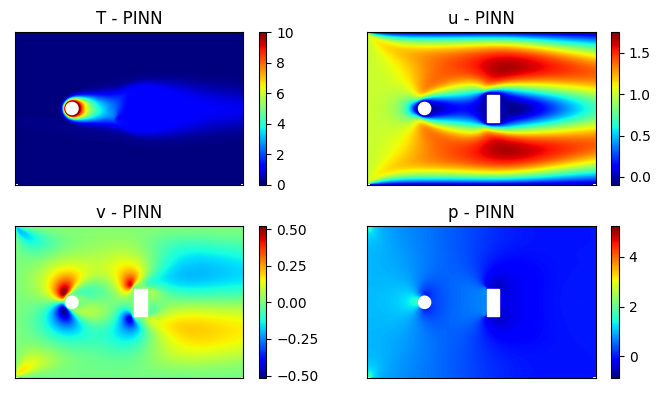

Epoch: 76000 Loss: 0.08502557 Loss1: 0.00763479 Loss2: 0.07739078


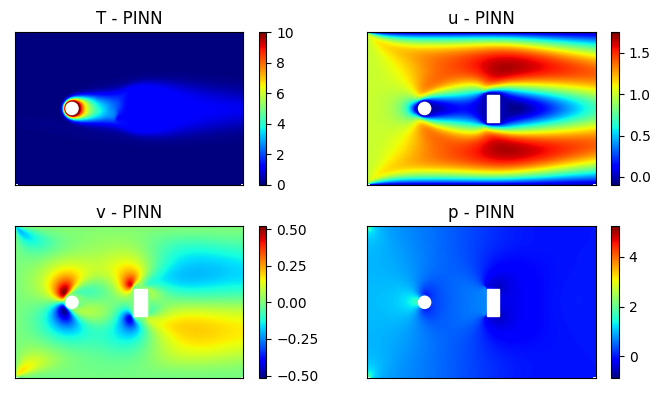

Epoch: 76500 Loss: 0.11257707 Loss1: 0.00468715 Loss2: 0.10788991


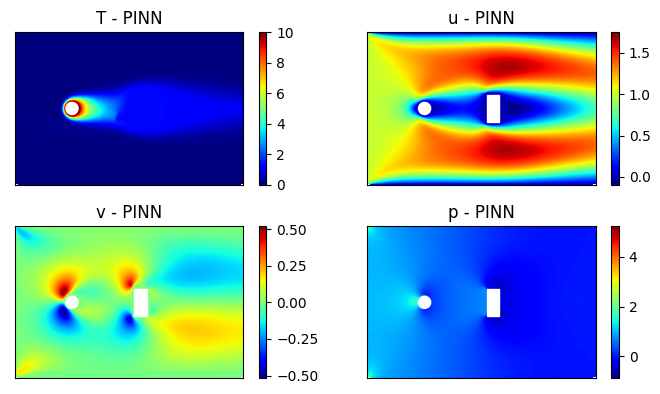

Epoch: 77000 Loss: 0.08350880 Loss1: 0.00561586 Loss2: 0.07789294


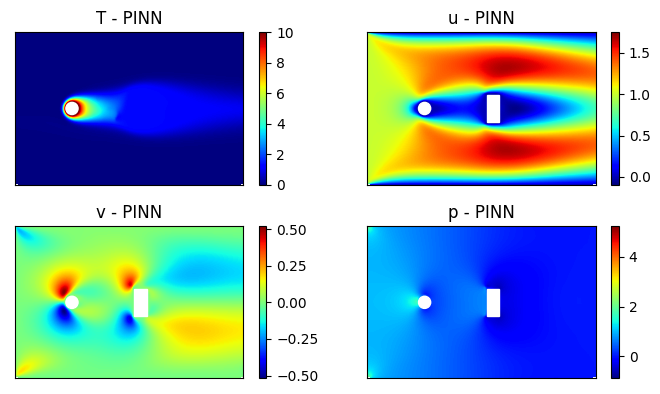

Epoch: 77500 Loss: 0.07408971 Loss1: 0.00470911 Loss2: 0.06938060


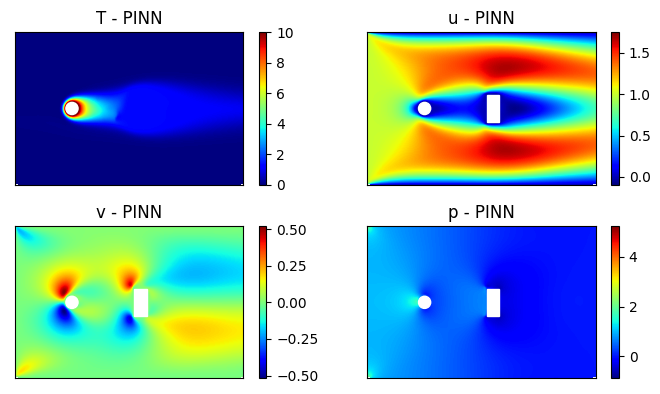

Epoch: 78000 Loss: 0.08408701 Loss1: 0.00512731 Loss2: 0.07895970


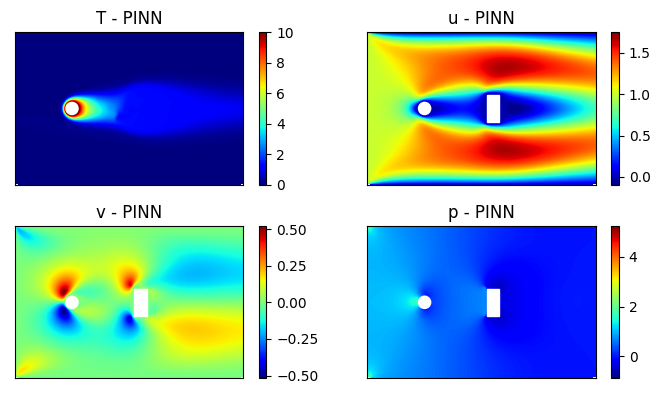

Epoch: 78500 Loss: 0.06613985 Loss1: 0.00512523 Loss2: 0.06101463


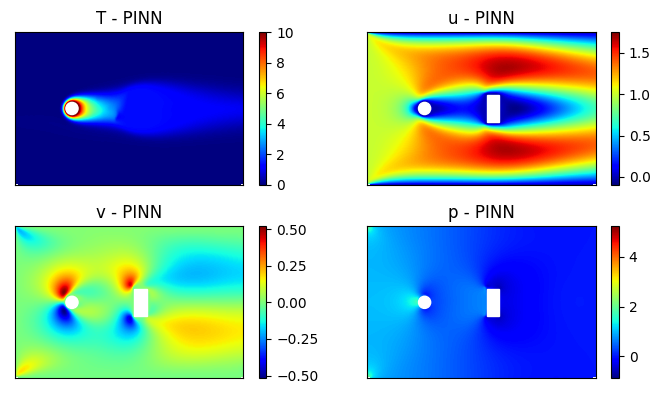

Epoch: 79000 Loss: 0.06667624 Loss1: 0.00509179 Loss2: 0.06158446


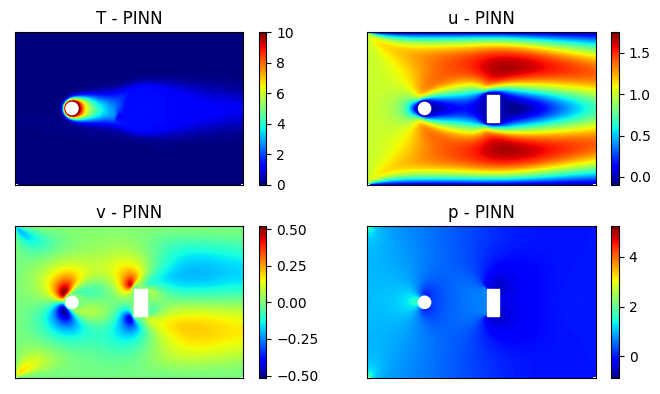

Epoch: 79500 Loss: 0.06061966 Loss1: 0.00419363 Loss2: 0.05642603


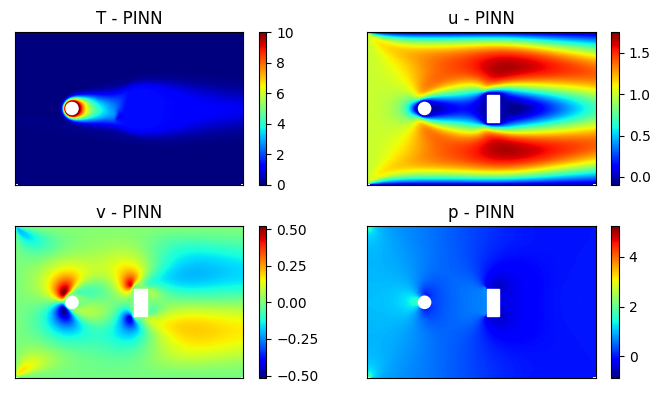

Epoch: 80000 Loss: 0.07586991 Loss1: 0.00407183 Loss2: 0.07179808


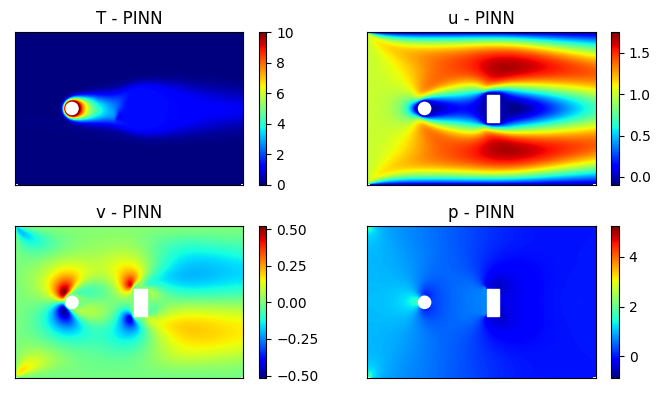

Epoch: 80500 Loss: 0.06082907 Loss1: 0.00477581 Loss2: 0.05605325


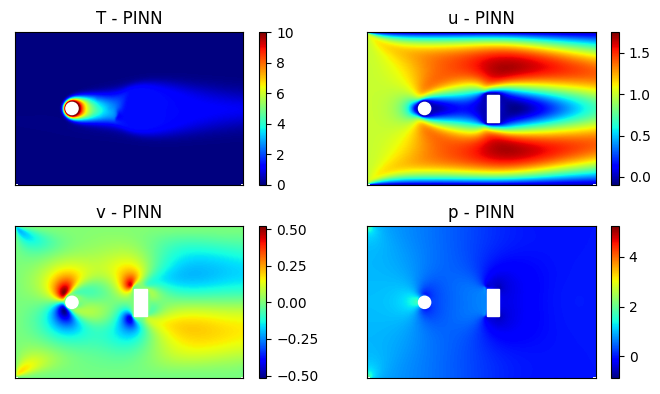

Epoch: 81000 Loss: 0.15670519 Loss1: 0.00505810 Loss2: 0.15164709


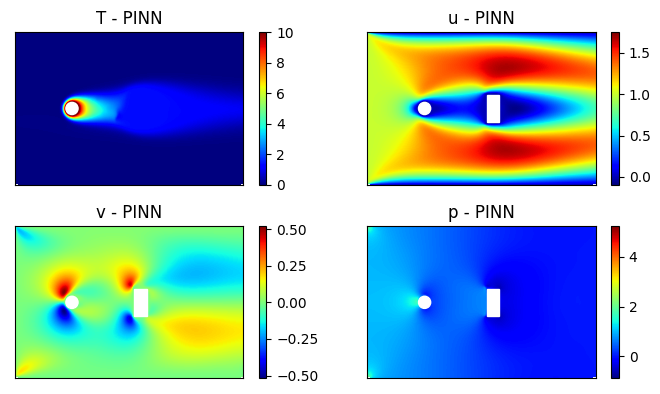

Epoch: 81500 Loss: 0.06692872 Loss1: 0.00505363 Loss2: 0.06187509


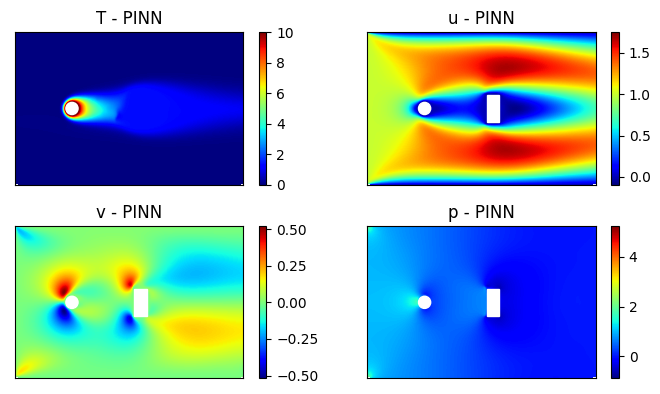

Epoch: 82000 Loss: 0.05818460 Loss1: 0.00483609 Loss2: 0.05334851


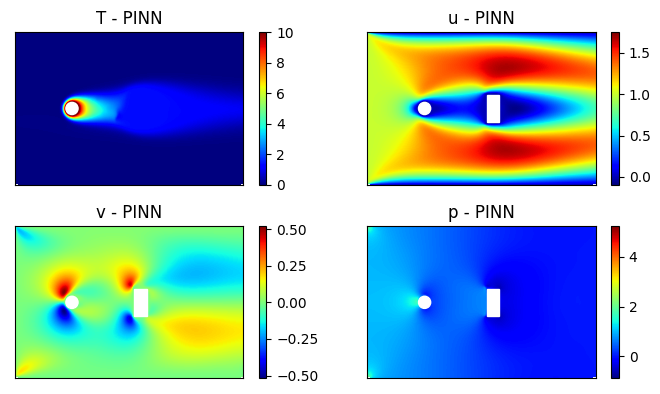

Epoch: 82500 Loss: 0.05223300 Loss1: 0.00392271 Loss2: 0.04831028


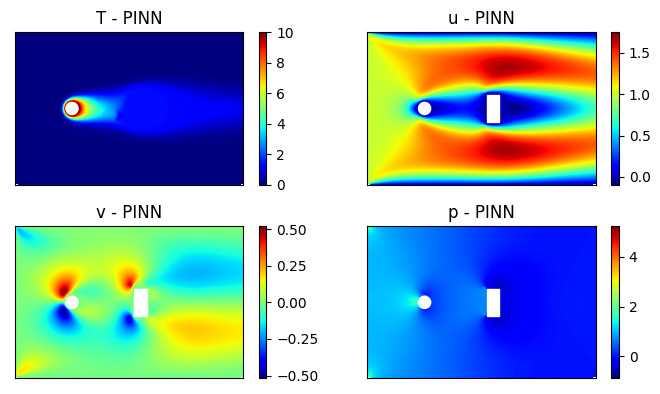

Epoch: 83000 Loss: 0.07350031 Loss1: 0.00473394 Loss2: 0.06876637


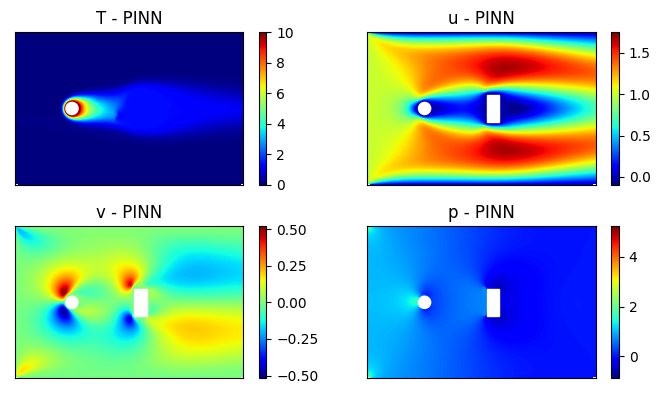

Epoch: 83500 Loss: 0.04864071 Loss1: 0.00385482 Loss2: 0.04478589


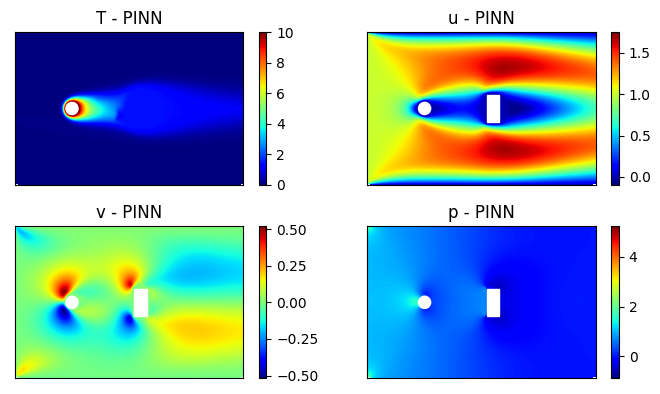

Epoch: 84000 Loss: 0.05931389 Loss1: 0.00399898 Loss2: 0.05531492


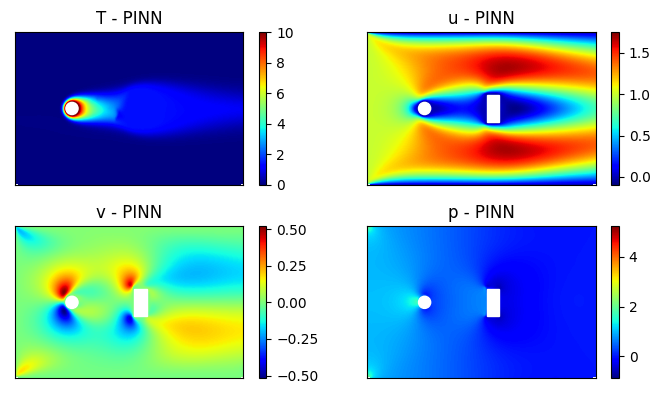

Epoch: 84500 Loss: 0.05222352 Loss1: 0.00405442 Loss2: 0.04816910


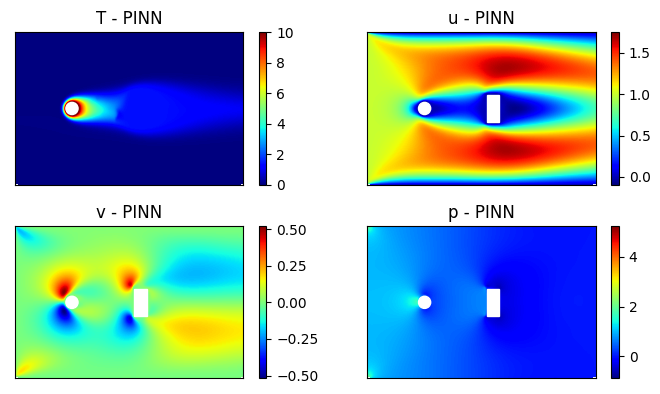

Epoch: 85000 Loss: 0.04783192 Loss1: 0.00449557 Loss2: 0.04333634


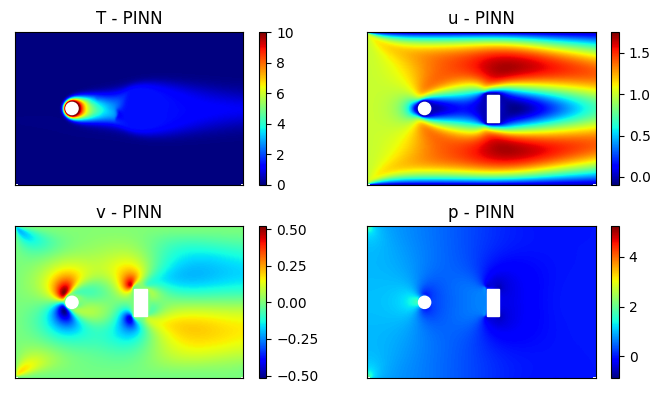

Epoch: 85500 Loss: 0.04606476 Loss1: 0.00375013 Loss2: 0.04231464


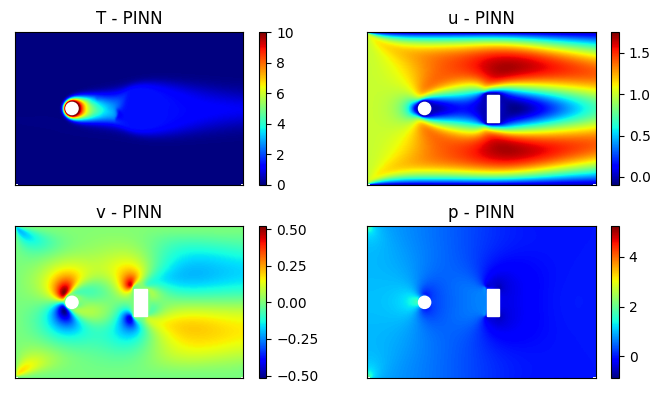

Epoch: 86000 Loss: 0.05747835 Loss1: 0.00518264 Loss2: 0.05229571


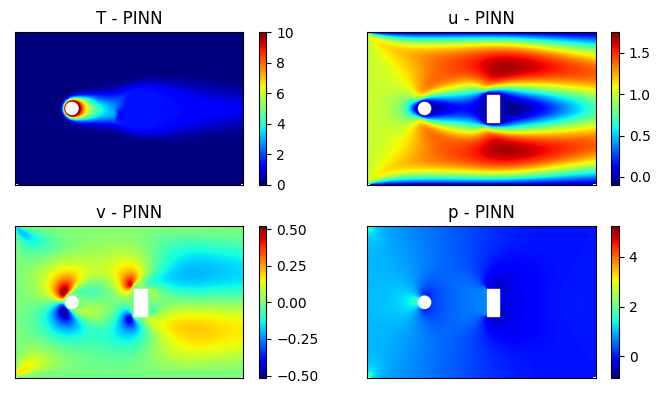

Epoch: 86500 Loss: 0.04641866 Loss1: 0.00455423 Loss2: 0.04186442


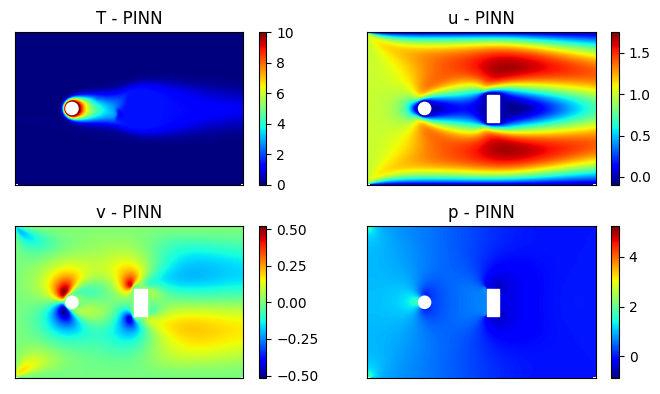

Epoch: 87000 Loss: 0.04624895 Loss1: 0.00382291 Loss2: 0.04242605


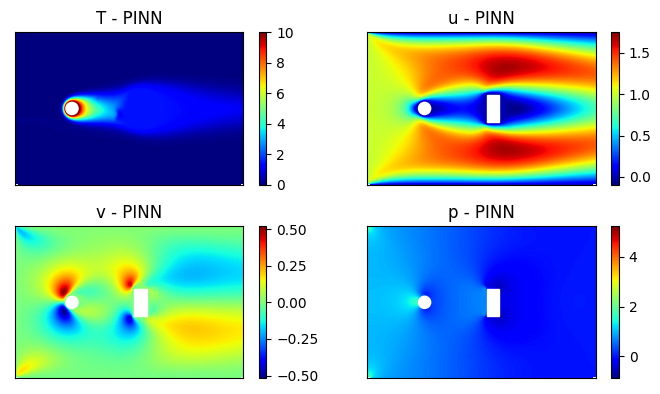

Epoch: 87500 Loss: 0.06159291 Loss1: 0.00351000 Loss2: 0.05808292


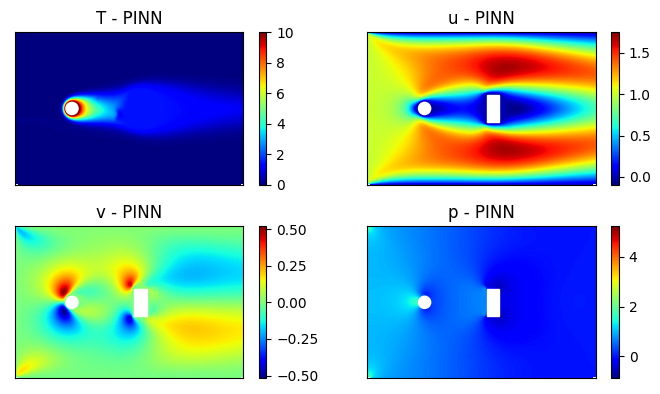

Epoch: 88000 Loss: 0.04816894 Loss1: 0.00400761 Loss2: 0.04416133


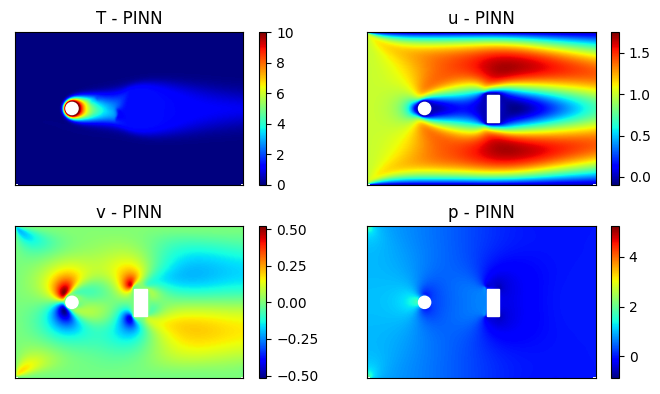

Epoch: 88500 Loss: 0.04436855 Loss1: 0.00439987 Loss2: 0.03996868


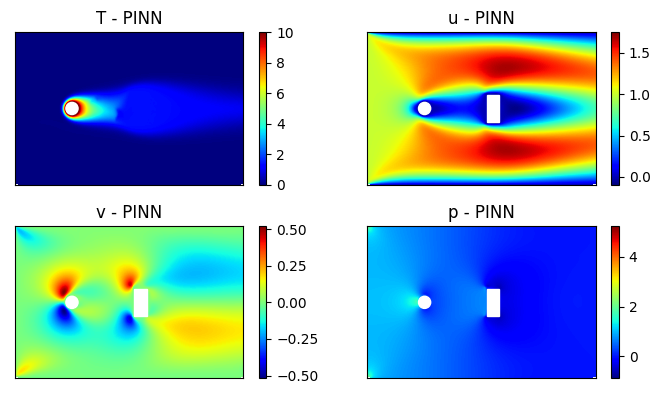

Epoch: 89000 Loss: 0.03584307 Loss1: 0.00482289 Loss2: 0.03102018


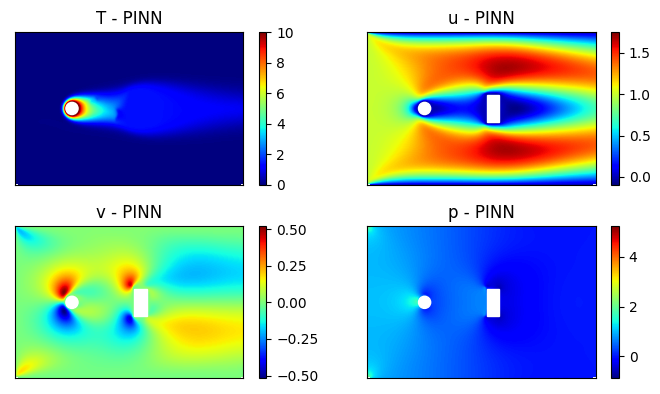

Epoch: 89500 Loss: 0.04109794 Loss1: 0.00535764 Loss2: 0.03574030


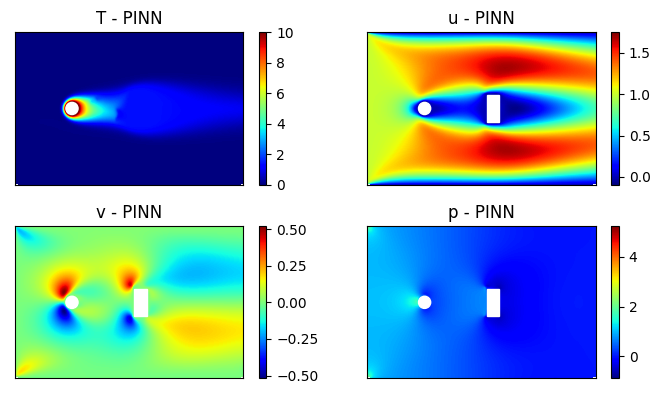

Epoch: 90000 Loss: 0.03527620 Loss1: 0.00502600 Loss2: 0.03025020


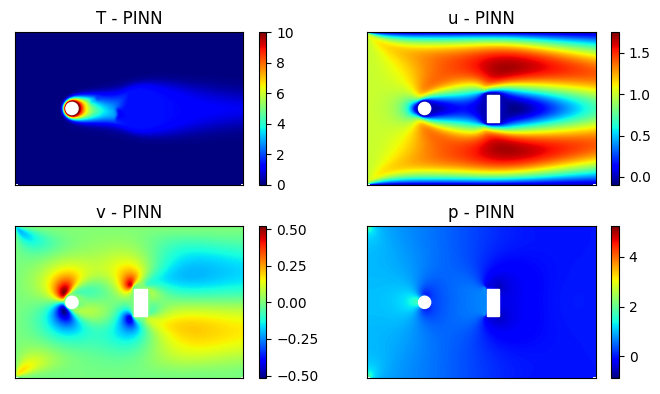

Epoch: 90500 Loss: 0.03375439 Loss1: 0.00417854 Loss2: 0.02957585


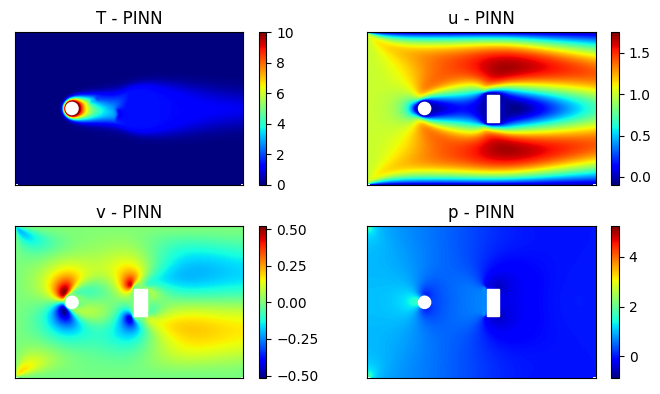

Epoch: 91000 Loss: 0.02472927 Loss1: 0.00384290 Loss2: 0.02088637


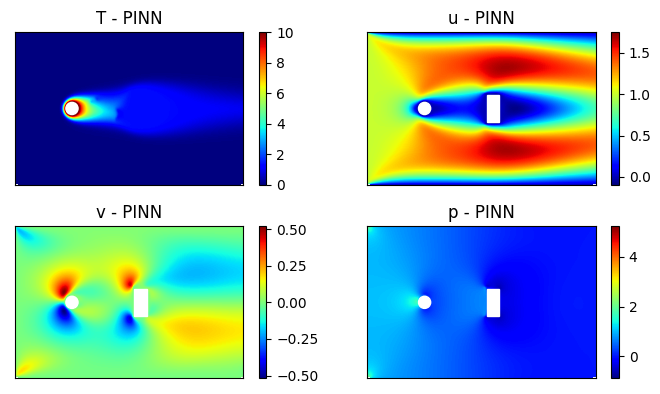

Epoch: 91500 Loss: 0.02897048 Loss1: 0.00360343 Loss2: 0.02536705


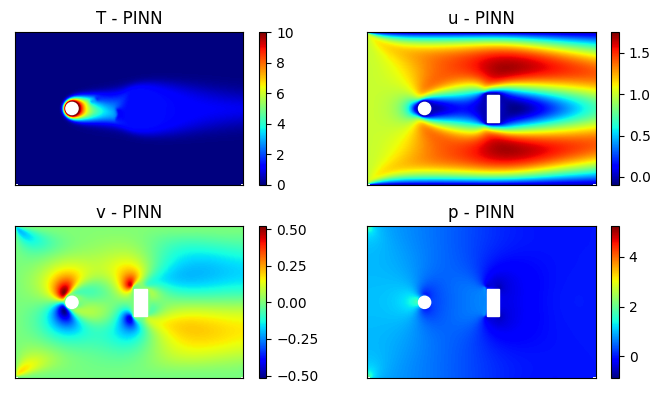

In [ ]:
while epoch < 150001:
    Loss_PDE_F = PDE_F1(model1, collocation_points)  
    Loss_BC_F = BC_F(model1, collocation_points, inlet)
    
    # Loss about fluid flow
    Loss_PDE_F_u = Loss_func(Loss_PDE_F[0].float(), torch.zeros_like(Loss_PDE_F[0]).to(device))
    Loss_PDE_F_v = Loss_func(Loss_PDE_F[1].float(), torch.zeros_like(Loss_PDE_F[1]).to(device))
    Loss_PDE_F_cont = Loss_func(Loss_PDE_F[2].float(), torch.zeros_like(Loss_PDE_F[2]).to(device)) 

    loss_pde_f = Loss_PDE_F_u + Loss_PDE_F_v + Loss_PDE_F_cont
    
    Loss_BC_top = Loss_func(Loss_BC_F[0].float(), torch.zeros_like(Loss_BC_F[0]).to(device))
    Loss_BC_bottom = Loss_func(Loss_BC_F[1].float(), torch.zeros_like(Loss_BC_F[1]).to(device))
    Loss_BC_left_u = Loss_func(Loss_BC_F[2].float(), torch.zeros_like(Loss_BC_F[2]).to(device))
    Loss_BC_left_v = Loss_func(Loss_BC_F[3].float(), torch.zeros_like(Loss_BC_F[3]).to(device))
    Loss_BC_right = Loss_func(Loss_BC_F[4].float(), torch.zeros_like(Loss_BC_F[4]).to(device))
    BC_cylinder = Loss_func(Loss_BC_F[5].float(), torch.zeros_like(Loss_BC_F[5]).to(device))
    BC_saga = Loss_func(Loss_BC_F[6].float(), torch.zeros_like(Loss_BC_F[6]).to(device))
    
    loss_bc_f =  Loss_BC_top + Loss_BC_bottom + Loss_BC_left_u + Loss_BC_left_v + \
               Loss_BC_right + BC_cylinder + BC_saga
    
    loss1 = loss_pde_f + loss_bc_f
    
    optimizer1.zero_grad()
    loss1.backward()
    optimizer1.step()
    
    # Loss about fluid heat exchange
    Loss_PDE_T = PDE_F2(model1, model2, collocation_points)
    Loss_PDE_S = PDE_S(model2, collocation_points)
    Loss_BC_T = BC_T(model2, collocation_points)
    
    Loss_PDE_T_convection = Loss_func(Loss_PDE_T[0].float(), torch.zeros_like(Loss_PDE_T[0]).to(device)) 
    Loss_PDF_S_conduction = Loss_func(Loss_PDE_S[0].float(), torch.zeros_like(Loss_PDE_S[0]).to(device))
    
    loss_pde_t = Loss_PDE_T_convection + Loss_PDF_S_conduction
    
    Loss_BC_top_T = Loss_func(Loss_BC_T[0].float(), torch.zeros_like(Loss_BC_T[0]).to(device))
    Loss_BC_bottom_T = Loss_func(Loss_BC_T[1].float(), torch.zeros_like(Loss_BC_T[1]).to(device))
    Loss_BC_left_T = Loss_func(Loss_BC_T[2].float(), torch.zeros_like(Loss_BC_T[2]).to(device))
    Loss_BC_right_dT_x = Loss_func(Loss_BC_T[3].float(), torch.zeros_like(Loss_BC_T[3]).to(device))
    Loss_BC_cylinder_T = Loss_func(Loss_BC_T[4].float(), torch.zeros_like(Loss_BC_T[4]).to(device))
    
    loss_bc_t = Loss_BC_top_T + Loss_BC_bottom_T + Loss_BC_left_T + Loss_BC_right_dT_x + Loss_BC_cylinder_T

    loss2 = loss_pde_t + loss_bc_t
    
    optimizer2.zero_grad()
    loss2.backward()
    optimizer2.step()
    
    loss_total = loss1 + loss2
    loss_pde = loss_pde_f + loss_pde_t
    loss_bc = loss_bc_f + loss_bc_t
    
    loss_history.append(loss_total.item())
    loss_history_pde.append(loss_pde.item())
    loss_history_bc.append(loss_bc.item())
    
    if loss_total.item() < max_loss:
        torch.save(model1, './weights/facc_pinn_v10/v10_model1.pt')
        torch.save(model2, './weights/facc_pinn_v10/v10_model2.pt')
        max_loss = loss_total.item()

    if epoch % 500 == 0:
        with torch.no_grad():
            model1_test = torch.load('./weights/facc_pinn_v10/v10_model1.pt')
            model2_test = torch.load('./weights/facc_pinn_v10/v10_model2.pt')
            print('Epoch: {} Loss: {:.8f} Loss1: {:.8f} Loss2: {:.8f}'.format(epoch, loss_total.item(), loss1.item(), loss2.item()))
            PLOT(model1_test, model2_test, cor_fluid, cor_saga, CFD_results_fluid, CFD_results_saga, epoch, history=False)
    epoch += 1